# Time Series Analysis

Import library and dataset:

In [358]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import zlib
import datetime
import tensorflow as tf
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.metrics import pairwise_distances
from tslearn.metrics import dtw_path as dtw
from sklearn.cluster import AgglomerativeClustering
from tslearn.piecewise import PiecewiseAggregateApproximation
from sklearn.cluster import KMeans
import scipy.stats as stats
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import euclidean
from time_series_utils import *
from matrixprofile import *
from matrixprofile.discords import discords
from claspy.window_size import highest_autocorrelation
from tslearn.shapelets import ShapeletModel
from tslearn.shapelets import grabocka_params_to_shapelet_size_dict
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, make_scorer, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sktime.classification.kernel_based import RocketClassifier
from tslearn.shapelets import LearningShapelets
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier

In [2]:
incidents_df = pd.read_csv(
    '../data/incidents_cleaned.csv',
    parse_dates=['date', 'date_original'],
    date_parser=lambda x: pd.to_datetime(x, format='%Y-%m-%d')
)
incidents_df.drop_duplicates(inplace=True)

# drop rows where year is outside of 2014-2017
incidents_df = incidents_df[incidents_df['year'].between(2014, 2017)]

In [3]:
incidents_df.head(2)

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,...,defensive,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010
0,2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,...,False,False,False,False,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802
1,2017-04-03,2017-04-03,2017.0,4,3,0,PENNSYLVANIA,5647 US 6,41.6645,-78.7856,...,False,False,False,False,10.5,REPUBLICAN,206761.0,307843.0,67.164431,12702379


We use only data corresponding to incidents in 2014, 2015, 2016 or 2017. 

In [4]:
incidents_df['year'].unique()

array([2015., 2017., 2016., 2014.])

In [5]:
pd.to_datetime('2014-1-1', format='%Y-%m-%d').day_name()

'Wednesday'

In [6]:
pd.to_datetime('2014-1-6', format='%Y-%m-%d').day_name()

'Monday'

In [7]:
pd.to_datetime('2017-12-31', format='%Y-%m-%d').day_name()

'Sunday'

We extract a time series for each city, computing a value for each week of the 4 years a score.

Weeks are numbered from 0. The first week has 2 days less than the others.

6th January 2014 is Monday and belongs to week 1 (the second).

31th December 2017 is Sunday and belongs to week 208 (last one).

In [8]:
# Add columns week number, start from 0 for the first week of 2014
incidents_df['week'] = (incidents_df['date'] - pd.to_datetime('2013-12-30')).dt.days // 7

In [9]:
# number of weeks in the dataset
incidents_df['week'].max()

208

In [10]:
print('Number of weeks in the dataset: ', incidents_df['week'].max()+1)
print('Number of weeks of 7 days expected: ', ((365*4+1) - 5 ) / 7) # ok :)

Number of weeks in the dataset:  209
Number of weeks of 7 days expected:  208.0


In [11]:
incidents_df['week'].unique().shape # all weeks are present

(209,)

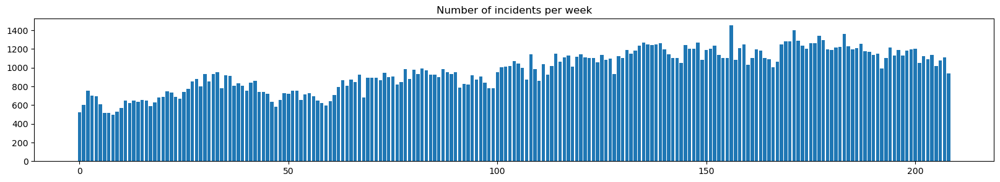

In [12]:
# group by week and count incidents
plt.figure(figsize=(20, 3))
plt.bar(
    incidents_df.groupby('week').size().index,
    incidents_df.groupby('week').size().values
)
plt.title('Number of incidents per week');

Group incidents by City and Week

In [13]:
# group by wee, city and state
incidents_df.groupby(['week', 'city', 'state']).count()

date  date_original  year  \
week city                       state                                       
0    Albany                     GEORGIA            1              1     1   
     Albuquerque                NEW MEXICO         1              1     1   
     Allentown                  PENNSYLVANIA       1              1     1   
     Altoona                    IOWA               1              1     1   
     Amarillo                   TEXAS              1              1     1   
...                                              ...            ...   ...   
208  Winnsboro                  SOUTH CAROLINA     1              1     1   
     Yakima                     WASHINGTON         4              4     4   
     York                       PENNSYLVANIA       1              1     1   
     Youngstown                 OHIO               3              3     3   
     Ypsilanti Charter Township MICHIGAN           1              1     1   

                                                month  day  day_of_week  \
week city                       state                                     
0    Albany                     GEORGIA             1    1            1   
     Albuquerque                NEW MEXICO          1    1            1   
     Allentown                  PENNSYLVANIA        1    1            1   
     Altoona                    IOWA                1    1            1   
     Amarillo                   TEXAS               1    1            1   
...                                               ...  ...          ...   
208  Winnsboro                  SOUTH CAROLINA      1    1            1   
     Yakima                     WASHINGTON          4    4            4   
     York                       PENNSYLVANIA        1    1            1   
     Youngstown                 OHIO                3    3            3   
     Ypsilanti Charter Township MICHIGAN            1    1            1   

                                                address  latitude  longitude  \
week city                       state                                          
0    Albany                     GEORGIA               1         1          1   
     Albuquerque                NEW MEXICO            1         1          1   
     Allentown                  PENNSYLVANIA          1         1          1   
     Altoona                    IOWA                  0         1          1   
     Amarillo                   TEXAS                 1         1          1   
...                                                 ...       ...        ...   
208  Winnsboro                  SOUTH CAROLINA        1         1          1   
     Yakima                     WASHINGTON            4         4          4   
     York                       PENNSYLVANIA          1         1          1   
     Youngstown                 OHIO                  2         3          3   
     Ypsilanti Charter Township MICHIGAN              1         1          1   

                                                county  ...  defensive  \
week city                       state                   ...              
0    Albany                     GEORGIA              1  ...          1   
     Albuquerque                NEW MEXICO           1  ...          1   
     Allentown                  PENNSYLVANIA         1  ...          1   
     Altoona                    IOWA                 1  ...          1   
     Amarillo                   TEXAS                1  ...          1   
...                                                ...  ...        ...   
208  Winnsboro                  SOUTH CAROLINA       1  ...          1   
     Yakima                     WASHINGTON           4  ...          4   
     York                       PENNSYLVANIA         1  ...          1   
     Youngstown                 OHIO                 3  ...          3   
     Ypsilanti Charter Township MICHIGAN             1  ...          1   

                                                workplace  abducti

We consider only cities with a number of weeks with incidents greater than 15% of the total number of the weeks of the 4 years.

In [14]:
0.15 * 209 # consider only cities with incidents in more than 30 weeks

31.349999999999998

In [15]:
incidents_df.groupby(['city', 'state'])['week'].count() # 10200 distinct cities

city         state         
Abbeville    ALABAMA            2
             GEORGIA            1
             LOUISIANA         15
             SOUTH CAROLINA     2
Abbotsford   WISCONSIN          1
                               ..
Zionsville   INDIANA            5
Zumbrota     MINNESOTA          1
Zuni         COLORADO           4
Zuni Pueblo  NEW MEXICO         1
Zwolle       LOUISIANA          1
Name: week, Length: 10200, dtype: int64

We drop incidents with NaN values for n_particpants (i.e. incidents where we don not know the number of participants).

In [16]:
# drop incidents where n_participants is nan
incidents_df = incidents_df[~incidents_df['n_participants'].isna()]

In [17]:
(incidents_df.groupby(['city', 'state'])['week'].count() > 30).to_list().count(True) # 588 cities with incidents in more than 30 weeks

588

In [18]:
# list of index of incidents in city with incidents in more than 30 weeks
index_list = np.where(incidents_df.groupby(['city', 'state'])['week'].transform('count') > 30)

In [19]:
# create a df with incidents_df where index is in index_list
incidents_df = incidents_df.iloc[index_list]
incidents_df.head(2)

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,...,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010,week
0,2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,...,False,False,False,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802,69
2,2016-11-05,2016-11-05,2016.0,11,5,5,MICHIGAN,6200 Block of East McNichols Road,42.4190,-83.0393,...,False,False,False,11.0,DEMOCRAT,244135.0,310974.0,78.506563,9883640,148


In [20]:
incidents_df.groupby(['week', 'city', 'state']).count()

date  date_original  year  \
week city                       state                                       
0    Albany                     GEORGIA            1              1     1   
     Albuquerque                NEW MEXICO         1              1     1   
     Allentown                  PENNSYLVANIA       1              1     1   
     Amarillo                   TEXAS              1              1     1   
     Anchorage                  ALASKA             2              2     2   
...                                              ...            ...   ...   
208  Wilmington                 NORTH CAROLINA     1              1     1   
     Yakima                     WASHINGTON         4              4     4   
     York                       PENNSYLVANIA       1              1     1   
     Youngstown                 OHIO               1              1     1   
     Ypsilanti Charter Township MICHIGAN           1              1     1   

                                                month  day  day_of_week  \
week city                       state                                     
0    Albany                     GEORGIA             1    1            1   
     Albuquerque                NEW MEXICO          1    1            1   
     Allentown                  PENNSYLVANIA        1    1            1   
     Amarillo                   TEXAS               1    1            1   
     Anchorage                  ALASKA              2    2            2   
...                                               ...  ...          ...   
208  Wilmington                 NORTH CAROLINA      1    1            1   
     Yakima                     WASHINGTON          4    4            4   
     York                       PENNSYLVANIA        1    1            1   
     Youngstown                 OHIO                1    1            1   
     Ypsilanti Charter Township MICHIGAN            1    1            1   

                                                address  latitude  longitude  \
week city                       state                                          
0    Albany                     GEORGIA               1         1          1   
     Albuquerque                NEW MEXICO            1         1          1   
     Allentown                  PENNSYLVANIA          1         1          1   
     Amarillo                   TEXAS                 1         1          1   
     Anchorage                  ALASKA                2         2          2   
...                                                 ...       ...        ...   
208  Wilmington                 NORTH CAROLINA        1         1          1   
     Yakima                     WASHINGTON            4         4          4   
     York                       PENNSYLVANIA          1         1          1   
     Youngstown                 OHIO                  0         1          1   
     Ypsilanti Charter Township MICHIGAN              1         1          1   

                                                county  ...  defensive  \
week city                       state                   ...              
0    Albany                     GEORGIA              1  ...          1   
     Albuquerque                NEW MEXICO           1  ...          1   
     Allentown                  PENNSYLVANIA         1  ...          1   
     Amarillo                   TEXAS                1  ...          1   
     Anchorage                  ALASKA               2  ...          2   
...                                                ...  ...        ...   
208  Wilmington                 NORTH CAROLINA       1  ...          1   
     Yakima                     WASHINGTON           4  ...          4   
     York                       PENNSYLVANIA         1  ...          1   
     Youngstown                 OHIO                 1  ...          1   
     Ypsilanti Charter Township MICHIGAN             1  ...          1   

                                                workplace  abducti

In [21]:
incidents_df['state'].unique().shape # 51: all states are present

(51,)

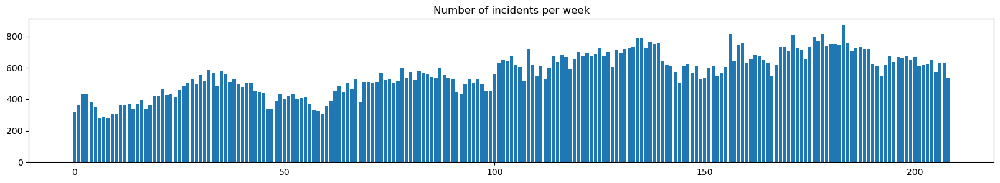

In [22]:
# group by week and count incidents
plt.figure(figsize=(20, 3))
plt.bar(
    incidents_df.groupby('week').size().index,
    incidents_df.groupby('week').size().values
)
plt.title('Number of incidents per week');

In [23]:
# number of incidents in which n_killed is nan
incidents_df[incidents_df['n_killed'].isna()].shape[0] # 0

0

## Create Time series

We create time series model each city as a sequence of incidents.

In [24]:
# Model each city as a sequence of incidents
incidents_df.groupby(['city', 'state'])['week'].count().sort_values(ascending=False) # 664 time series

city              state       
Chicago           ILLINOIS        10217
City of New York  NEW YORK         3092
Baltimore         MARYLAND         2790
New Orleans       LOUISIANA        2463
Philadelphia      PENNSYLVANIA     2400
                                  ...  
Inkster           MICHIGAN           31
Kissimmee         FLORIDA            31
Crestview         FLORIDA            31
Carlsbad          NEW MEXICO         31
Grenada           MISSISSIPPI        31
Name: week, Length: 588, dtype: int64

We create time series that rappresent the mean number of participants per incident per week in each city.

The time series assumes value 0 if we have no incidents in the week.

In [25]:
# create a dataset with series of mean number of participants per incident per week in each city
incidents_by_city_df = incidents_df.groupby(['city', 'state', 'week'])['n_participants'].mean().reset_index()
incidents_by_city_df = incidents_by_city_df.pivot(index=['city', 'state'], columns='week', values='n_participants')
incidents_by_city_df = incidents_by_city_df.fillna(0) # substitute NaN with 0
incidents_by_city_df

week                                       0    1    2    3    4    5    6    \
city                       state                                               
Abilene                    TEXAS           0.0  0.0  0.0  2.0  0.0  0.0  0.0   
Aiken                      SOUTH CAROLINA  0.0  4.0  0.0  0.0  0.0  0.0  0.0   
Akron                      OHIO            0.0  0.0  0.0  2.5  0.0  0.0  0.0   
Albany                     GEORGIA         1.0  0.0  1.0  0.0  0.0  0.0  0.0   
                           OREGON          0.0  0.0  0.0  0.0  0.0  0.0  0.0   
...                                        ...  ...  ...  ...  ...  ...  ...   
York                       PENNSYLVANIA    0.0  0.0  0.0  0.0  0.0  1.0  1.0   
Youngstown                 OHIO            0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Ypsilanti                  MICHIGAN        0.0  0.0  2.0  5.0  0.0  0.0  0.0   
Ypsilanti Charter Township MICHIGAN        0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Yuma                       ARIZONA         0.0  2.0  0.0  0.0  0.0  2.0  0.0   

week                                       7    8    9    ...       199  \
city                       state                          ...             
Abilene                    TEXAS           0.0  0.0  0.0  ...  0.000000   
Aiken                      SOUTH CAROLINA  0.0  0.0  2.0  ...  3.000000   
Akron                      OHIO            0.0  0.0  3.0  ...  1.000000   
Albany                     GEORGIA         0.0  0.0  0.0  ...  1.333333   
                           OREGON          0.0  0.0  0.0  ...  0.000000   
...                                        ...  ...  ...  ...       ...   
York                       PENNSYLVANIA    0.0  1.0  0.0  ...  1.000000   
Youngstown                 OHIO            0.0  0.0  0.0  ...  1.333333   
Ypsilanti                  MICHIGAN        0.0  0.0  0.0  ...  0.000000   
Ypsilanti Charter Township MICHIGAN        0.0  0.0  0.0  ...  0.000000   
Yuma                       ARIZONA         0.0  0.0  1.0  ...  2.000000   

week                                            200       201       202  \
city                       state                                          
Abilene                    TEXAS           0.000000  0.000000  0.000000   
Aiken                      SOUTH CAROLINA  2.000000  0.000000  2.000000   
Akron                      OHIO            2.000000  0.000000  1.500000   
Albany                     GEORGIA         0.000000  6.000000  0.000000   
                           OREGON          0.000000  0.000000  0.000000   
...                                             ...       ...       ...   
York                       PENNSYLVANIA    1.333333  1.666667  1.500000   
Youngstown                 OHIO            2.000000  1.333333  1.333333   
Ypsilanti                  MICHIGAN        0.000000  0.000000  0.000000   
Ypsilanti Charter Township MICHIGAN        0.000000  0.000000  0.000000   
Yuma                       ARIZONA         0.000000  0.000000  0.000000   

week                                            203   204   205  206  207  \
city                       state                                            
Abilene                    TEXAS           0.000000  0.00  0.00  0.0  1.0   
Aiken                      SOUTH CAROLINA  0.000000  1.00  1.50  0.0  1.5   
Akron                      OHIO            1.000000  1.00  1.75  1.5  2.5   
Albany                     GEORGIA         0.000000  0.00  0.00  0.0  0.0   
                           OREGON          0.000000  0.00  0.00  0.0  0.0   
...                                             ...   ...   ...  ...  ...   
York                       PENNSYLVANIA    1.000000  1.00  0.00  1.5  2.0   
Youngstown                 OHIO            1.666667  1.75  2.00  1.0  1.0   
Ypsilanti                  MICHIGAN        1.000000  0.00  0.00  0.0  0.0   
Ypsilanti Charter Township MICHIGAN        1.000000  0.00  0.00  0.0  0.0   
Yuma                       ARIZONA         0.000000  2.00  0.00  2.0  1.0   

week 

We also create time series rappresent the mean number of killed people per incident per week in each city, in order to compare the results optained with the previusly definte time series.

In [26]:
# create a dataset with series of mean number of killed people per incident per week in each city
incidents_killed_by_city_df = incidents_df.groupby(['city', 'state', 'week'])['n_killed'].mean().reset_index()
incidents_killed_by_city_df = incidents_killed_by_city_df.pivot(index=['city', 'state'], columns='week', values='n_killed')
incidents_killed_by_city_df = incidents_killed_by_city_df.fillna(0) # substitute NaN with 0

We visualize how many time series (i.e. cities) we have for each state:

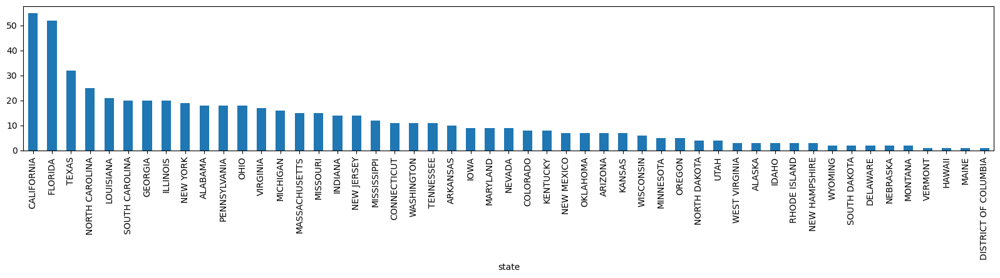

In [27]:
incidents_by_city_df.groupby('state')[0].count().sort_values(ascending=False).plot(kind='bar', figsize=(20, 3));

Visualize average of all time series:

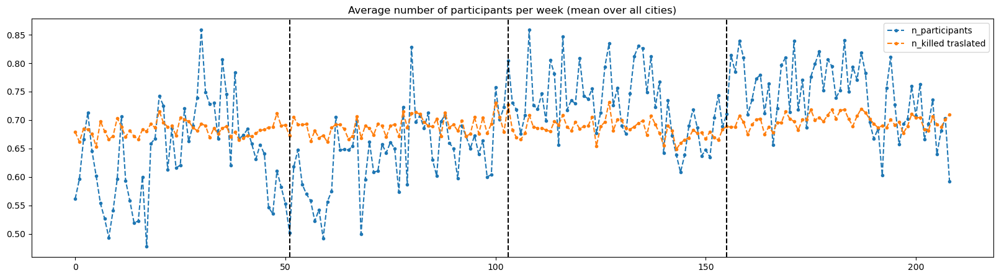

In [28]:
n_weeks_per_year = 52

plt.figure(figsize=(20, 5))
plt.plot(np.nanmean(incidents_by_city_df.values, axis=0), '.--', label='n_participants')
#plt.plot(np.nanmean(incidents_killed_by_city_df.values, axis=0), '.--', label='n_killed')
plt.plot(np.nanmean((incidents_killed_by_city_df.values+incidents_by_city_df.values.mean()-incidents_killed_by_city_df.values.mean()
    ), axis=0), '.--', label='n_killed traslated') # traslate n_killed to have the same mean of n_participants
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend()
plt.title('Average number of participants per week (mean over all cities)');

Visualize time series for New York, Los Angeles, Chicago:

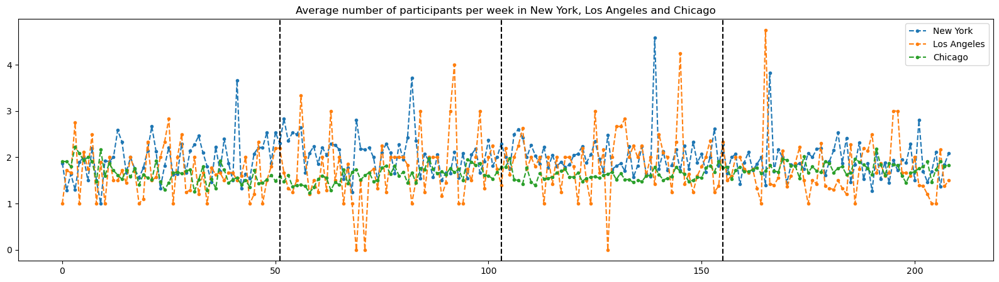

In [29]:
plt.figure(figsize=(20, 5))
new_york_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'City of New York')].values[0]
los_angeles_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Los Angeles')].values[0]
chicago_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Chicago')].values[0]
plt.plot(new_york_ts, '.--', label='New York')
plt.plot(los_angeles_ts, '.--', label='Los Angeles')
plt.plot(chicago_ts, '.--', label='Chicago')
plt.title('Average number of participants per week in New York, Los Angeles and Chicago')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend();

Visualize time series for city in ALASKA state:

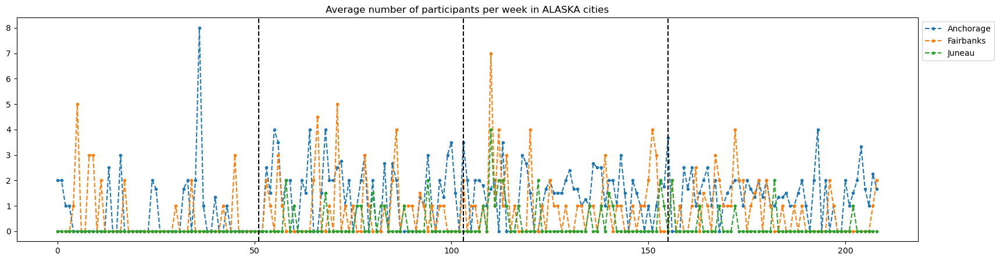

In [30]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.T, '.--')
plt.title('Average number of participants per week in ALASKA cities')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'
    ].index.get_level_values('city'), loc='upper left', bbox_to_anchor=(1, 1));

We visualize the number of zero values in the time series of each city:

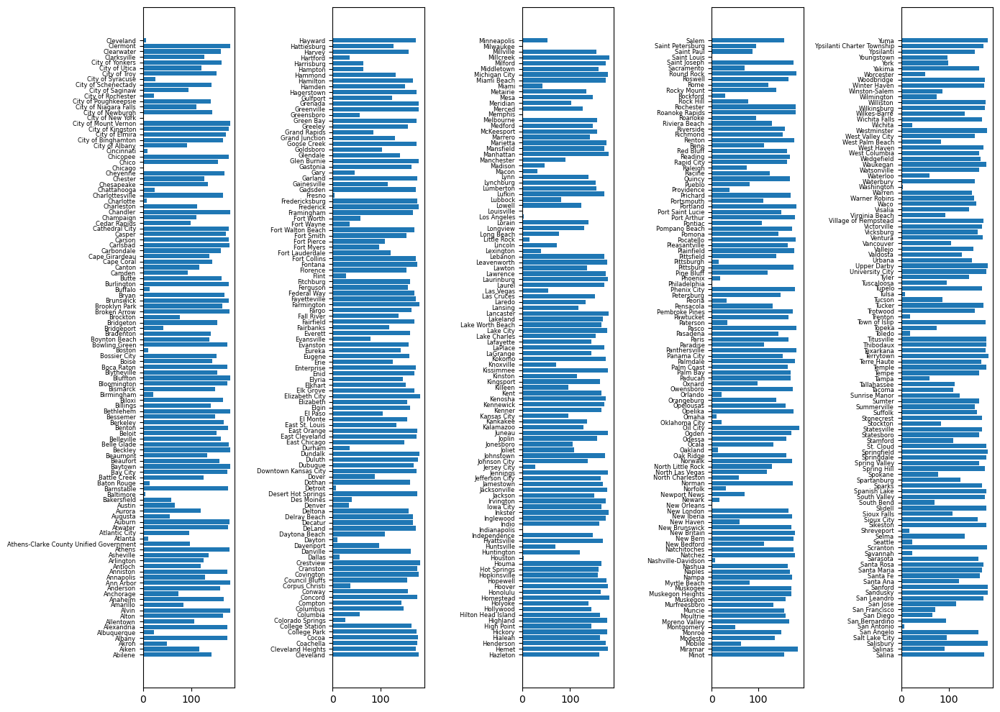

In [31]:
# visualize how many zeros in time series for each city
plt.figure(figsize=(14, 10))
plt.subplot(1, 5, 1)
plt.barh(incidents_by_city_df[:118].index.get_level_values('city'),
    incidents_by_city_df[:118].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 2)
plt.barh(incidents_by_city_df[118:236].index.get_level_values('city'),
    incidents_by_city_df[118:236].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 3)
plt.barh(incidents_by_city_df[236:354].index.get_level_values('city'),
    incidents_by_city_df[236:354].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 4)
plt.barh(incidents_by_city_df[354:471].index.get_level_values('city'),
    incidents_by_city_df[354:471].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
plt.subplot(1, 5, 5)
plt.barh(incidents_by_city_df[471:].index.get_level_values('city'),
    incidents_by_city_df[471:].apply(lambda x: np.sum(x == 0), axis=1).values)
plt.yticks(size=6)
#plt.suptitle('Number of zeros in time series for each city')
plt.tight_layout();

## Preprocessing

### Translate and Scaling Time Series

In [32]:
new_york_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'City of New York')].values[0]
los_angeles_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'Los Angeles')].values[0]
chicago_killed_ts = incidents_killed_by_city_df[(incidents_killed_by_city_df.index.get_level_values('city'
    ) == 'Chicago')].values[0]

Offset translation:

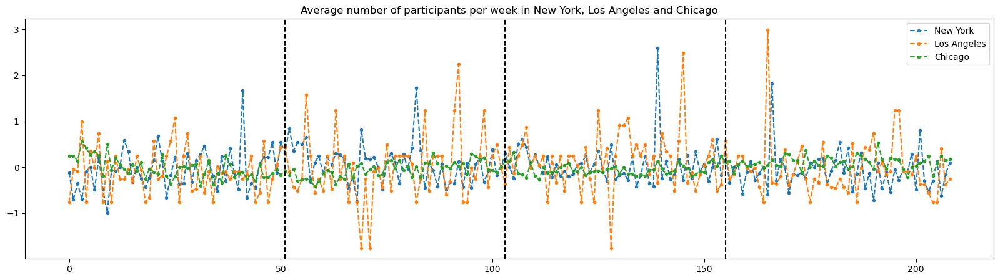

In [33]:
plt.figure(figsize=(20, 5))
plt.plot(new_york_ts-np.nanmean(new_york_ts), '.--', label='New York')
plt.plot(los_angeles_ts-np.nanmean(los_angeles_ts), '.--', label='Los Angeles')
plt.plot(chicago_ts-np.nanmean(chicago_ts), '.--', label='Chicago')
plt.title('Average number of participants per week in New York, Los Angeles and Chicago')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend();

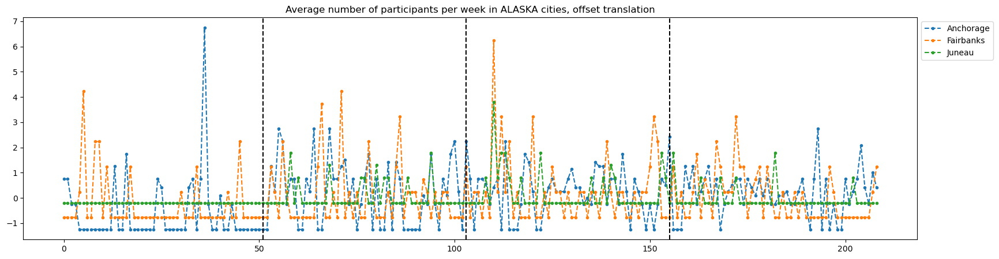

In [34]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.T - 
    incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].values.mean(axis=1), '.--')
plt.title('Average number of participants per week in ALASKA cities, offset translation')
plt.axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
plt.axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
plt.legend(incidents_by_city_df[incidents_by_city_df.index.get_level_values('state') == 'ALASKA'].index.get_level_values('city'), 
    loc='upper left', bbox_to_anchor=(1, 1));

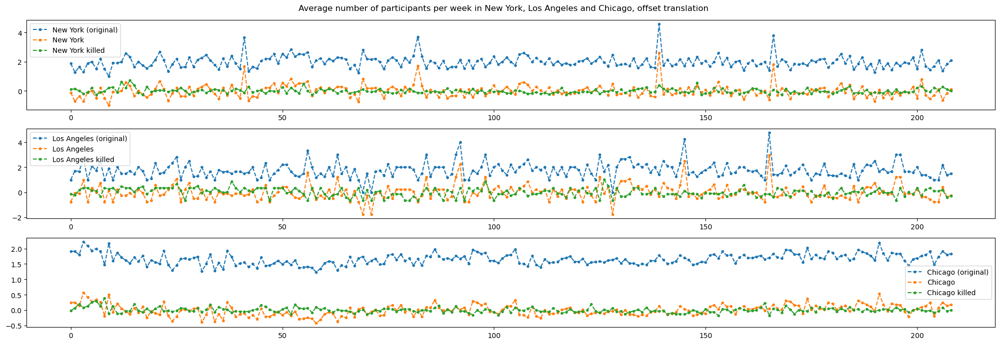

In [35]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(new_york_ts-np.nanmean(new_york_ts), '.--', label='New York')
ax[0].plot(new_york_killed_ts-np.nanmean(new_york_killed_ts), '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles (original)')
ax[1].plot(los_angeles_ts-np.nanmean(los_angeles_ts), '.--', label='Los Angeles')
ax[1].plot(los_angeles_killed_ts-np.nanmean(los_angeles_killed_ts), '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago (original)')
ax[2].plot(chicago_ts-np.nanmean(chicago_ts), '.--', label='Chicago')
ax[2].plot(chicago_killed_ts-np.nanmean(chicago_killed_ts), '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago, offset translation')
plt.tight_layout();

Amplitude scale:

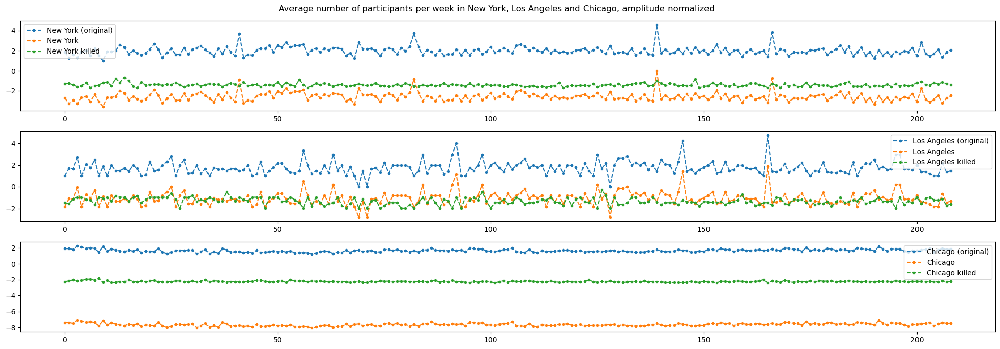

In [36]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(new_york_ts-np.nanmean(new_york_ts)/np.std(new_york_ts), '.--', label='New York')
ax[0].plot(new_york_killed_ts-np.nanmean(new_york_killed_ts)/np.std(new_york_killed_ts), '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles (original)')
ax[1].plot(los_angeles_ts-np.nanmean(los_angeles_ts)/np.std(los_angeles_ts), '.--', label='Los Angeles')
ax[1].plot(los_angeles_killed_ts-np.nanmean(los_angeles_killed_ts)/np.std(los_angeles_killed_ts), '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago (original)')
ax[2].plot(chicago_ts-np.nanmean(chicago_ts)/np.std(chicago_ts), '.--', label='Chicago')
ax[2].plot(chicago_killed_ts-np.nanmean(chicago_killed_ts)/np.std(chicago_killed_ts), '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago, amplitude normalized')
fig.tight_layout();


### Noise detection: tslearn library

tslearn is a Python package that provides machine learning tools for the analysis of time series. This package builds on (and hence depends on) scikit-learn, numpy and scipy libraries.

We used the TimeSeriesScalerMeanVariance from tslear.
This scaler standardizes time series data so that the mean in each dimension is set to *mu* and the standard deviation is set to *std*. In your case, you've mentioned that you used the default parameters with *mu=0* and *std=1*.

In [37]:
scaler = TimeSeriesScalerMeanVariance()
X = scaler.fit_transform(incidents_by_city_df.values)

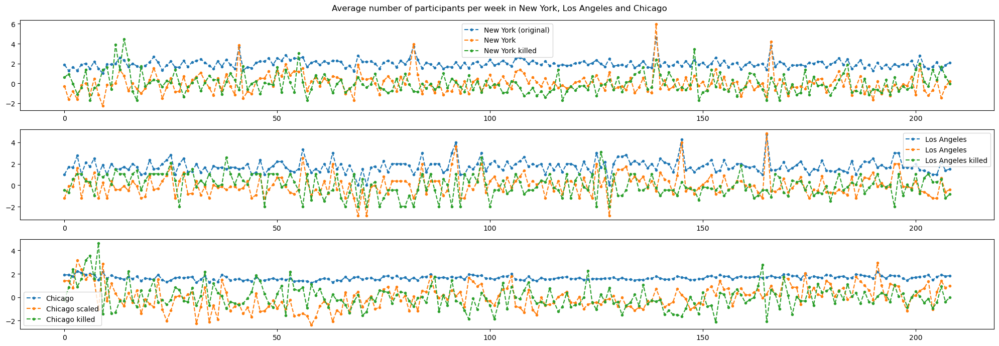

In [38]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7))
ax[0].plot(new_york_ts, '.--', label='New York (original)')
ax[0].plot(scaler.fit_transform(new_york_ts.reshape(1, -1))[0], '.--', label='New York')
ax[0].plot(scaler.fit_transform(new_york_killed_ts.reshape(1, -1))[0], '.--', label='New York killed')
ax[0].legend()
ax[1].plot(los_angeles_ts, '.--', label='Los Angeles')
ax[1].plot(scaler.fit_transform(los_angeles_ts.reshape(1, -1))[0], '.--', label='Los Angeles')
ax[1].plot(scaler.fit_transform(los_angeles_killed_ts.reshape(1, -1))[0], '.--', label='Los Angeles killed')
ax[1].legend()
ax[2].plot(chicago_ts, '.--', label='Chicago')
ax[2].plot(scaler.fit_transform(chicago_ts.reshape(1, -1))[0], '.--', label='Chicago scaled')
ax[2].plot(scaler.fit_transform(chicago_killed_ts.reshape(1, -1))[0], '.--', label='Chicago killed')
ax[2].legend()
fig.suptitle('Average number of participants per week in New York, Los Angeles and Chicago')
fig.tight_layout();

### Compute Distance Between Time Series

In [39]:
def ts_distance(ts1, ts2, city, verbose=True):
    if verbose: print(f'Time Series distance for {city}')
    ts_distance_df = pd.DataFrame()
    ts_distance_df.loc['euclidean', 'Original Time Series'] = euclidean(ts1, ts2)
    _, ts_distance_df.loc['DTW', 'Original Time Series'] = dtw(ts1, ts2)
    ts_distance_df.loc['euclidean', 'Offset Translation'] = euclidean(ts1-np.nanmean(ts1), ts2-np.nanmean(ts2))
    _, ts_distance_df.loc['DTW', 'Offset Translation'] = dtw(ts1-np.nanmean(ts1), ts2-np.nanmean(ts2))
    ts_distance_df.loc['euclidean', 'Amplitude Scaling'] = euclidean(ts1-np.nanmean(ts1)/np.std(ts1), ts2-np.nanmean(ts2)/np.std(ts2))
    _, ts_distance_df.loc['DTW', 'Amplitude Scaling'] = dtw(ts1-np.nanmean(ts1)/np.std(ts1), ts2-np.nanmean(ts2)/np.std(ts2))
    scaler = TimeSeriesScalerMeanVariance()
    ts_distance_df.loc['euclidean', 'Mean Variance Scaling'] = euclidean(scaler.fit_transform(ts1.reshape(1, -1))[0].reshape(-1), 
        scaler.fit_transform(ts2.reshape(1, -1))[0].reshape(-1))
    _, ts_distance_df.loc['DTW', 'Mean Variance Scaling'] = dtw(scaler.fit_transform(ts1.reshape(1, -1))[0].reshape(-1), 
        scaler.fit_transform(ts2.reshape(1, -1))[0].reshape(-1))
    if verbose: display(ts_distance_df)
    return ts_distance_df

We compute the distance between time series generated using the n_participants values and those generated using n_killed for all the transformations implemented before.

For visualization purpuse, we calculated and display the distances for the time series related to the cities of New York, Los Angeles, and Chicago, as well as the time series representing the average of all cities.

As metrics to compute distance we use Dynamic Time Warping (DTW) and Euclidan distance.

In [40]:
ts_distance(new_york_ts, new_york_killed_ts, 'City of New York')
ts_distance(los_angeles_ts, los_angeles_killed_ts, 'Los Angeles')
ts_distance(chicago_ts, chicago_killed_ts, 'Chicago')
ts_distance(incidents_by_city_df.mean(axis=0).values, incidents_killed_by_city_df.mean(axis=0).values, 'Average All Cities')

Time Series distance for City of New York


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,25.641264,6.470026,18.125146,19.313367
DTW,21.711393,4.828293,15.552054,10.625221


Time Series distance for Los Angeles


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,18.916004,10.037778,10.707546,20.087158
DTW,11.147646,6.416849,6.965931,10.994166


Time Series distance for Chicago


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,21.229690,2.697980,78.321722,19.028593
DTW,21.216154,1.687273,78.321722,9.973122


Time Series distance for Average All Cities


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,8.535847,1.110076,12.8925,14.488508
DTW,8.535847,0.910616,12.8925,9.457654


,Original Time Series,Offset Translation,Amplitude Scaling,Mean Variance Scaling
euclidean,8.535847,1.110076,12.8925,14.488508
DTW,8.535847,0.910616,12.8925,9.457654


Cumpute distance between time series generated using the n_participants values and those generated using n_killed for all the transformations implemented before for all the time series and visualize them:

In [41]:
original_ts_distance = []
offset_translation_ts_distance = []
amplitude_scaling_ts_distance = []
mean_variance_scaling_ts_distance = []

for ts1, ts2 in zip(incidents_by_city_df.values, incidents_killed_by_city_df.values):
    ts_distance_df = ts_distance(ts1, ts2, '', verbose=False)
    original_ts_distance.append(ts_distance_df.loc['DTW', 'Original Time Series'])
    offset_translation_ts_distance.append(ts_distance_df.loc['DTW', 'Offset Translation'])
    amplitude_scaling_ts_distance.append(ts_distance_df.loc['DTW', 'Amplitude Scaling'])
    mean_variance_scaling_ts_distance.append(ts_distance_df.loc['DTW', 'Mean Variance Scaling'])

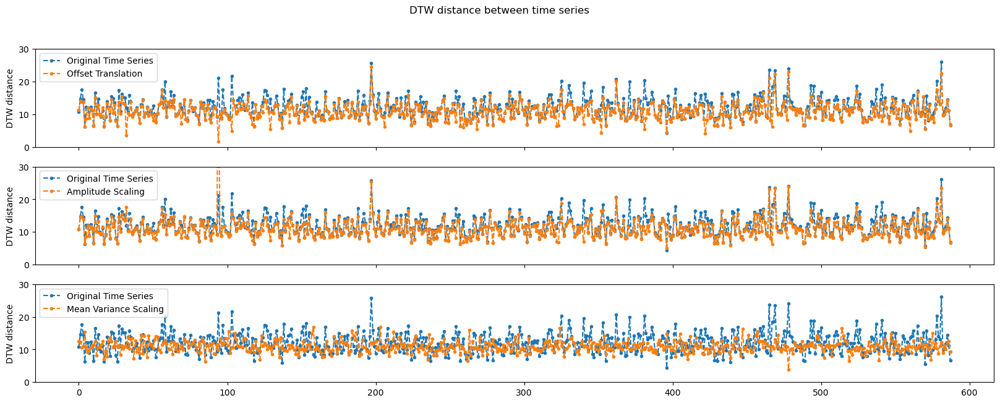

In [42]:
fig, ax = plt.subplots(3, 1, figsize=(20, 7), sharex=True, sharey=True)
ax[0].plot(original_ts_distance, '.--', label='Original Time Series')
ax[0].plot(offset_translation_ts_distance, '.--', label='Offset Translation')
ax[0].legend()
ax[0].set_ylabel('DTW distance')
ax[0].set_ylim(0, 30)

ax[1].plot(original_ts_distance, '.--', label='Original Time Series')
ax[1].plot(amplitude_scaling_ts_distance, '.--', label='Amplitude Scaling')
ax[1].legend()
ax[1].set_ylabel('DTW distance')

ax[2].plot(original_ts_distance, '.--', label='Original Time Series')
ax[2].plot(mean_variance_scaling_ts_distance, '.--', label='Mean Variance Scaling')
ax[2].legend()
ax[2].set_ylabel('DTW distance')

fig.suptitle('DTW distance between time series');

Each point on the plot represents the distance between the time series for a specific city.

We note that the time series scaled using the tslearn library are those for which the distance is minimized between the time series generated using n_participants and those generated using n_killed.

## Create dataset for Cities

To better understand the cluster analysis on the time series we are going to perform afterward, we have created a dataset containing data for each city by extracting information from the available dataset.

| Feature                           | Description                                             |
|-----------------------------------|---------------------------------------------------------|
| population_state_2010              | Mean population of the state in the year 2010.           |
| population_quantile                | Quantile of population_state_2010 (categorical).        |
| n_incidents_2014                   | Number of incidents in the year 2014.                    |
| n_incidents_2015                   | Number of incidents in the year 2015.                    |
| n_incidents_2016                   | Number of incidents in the year 2016.                    |
| n_incidents_2017                   | Number of incidents in the year 2017.                    |
| n_incidents                        | Total number of incidents across all years.              |
| n_incidents_quantile               | Quantile of n_incidents (categorical).                   |
| n_weeks_with_incidents_2014        | Number of weeks with incidents in the year 2014.         |
| n_weeks_with_incidents_2015        | Number of weeks with incidents in the year 2015.         |
| n_weeks_with_incidents_2016        | Number of weeks with incidents in the year 2016.         |
| n_weeks_with_incidents_2017        | Number of weeks with incidents in the year 2017.         |
| n_weeks_with_incidents             | Total number of weeks with incidents across all years.   |
| n_weeks_quantile                   | Quantile of n_weeks_with_incidents (categorical).        |
| n_participants_2014               | Total number of participants in incidents in 2014.       |
| n_participants_2015               | Total number of participants in incidents in 2015.       |
| n_participants_2016               | Total number of participants in incidents in 2016.       |
| n_participants_2017               | Total number of participants in incidents in 2017.       |
| n_participants                    | Total number of participants across all years.           |
| n_participants_quantile           | Quantile of n_participants (categorical).                |
| n_participants_avg_2014           | Average number of participants in incidents in 2014.     |
| n_participants_avg_2015           | Average number of participants in incidents in 2015.     |
| n_participants_avg_2016           | Average number of participants in incidents in 2016.     |
| n_participants_avg_2017           | Average number of participants in incidents in 2017.     |
| n_participants_avg                | Average number of participants across all years.         |
| n_killed_2014                     | Total number of killed in incidents in 2014.             |
| n_killed_2015                     | Total number of killed in incidents in 2015.             |
| n_killed_2016                     | Total number of killed in incidents in 2016.             |
| n_killed_2017                     | Total number of killed in incidents in 2017.             |
| n_killed                          | Total number of killed across all years.                 |
| n_killed_quantile                 | Quantile of n_killed (categorical).                      |
| n_killed_avg_2014                 | Average number of killed in incidents in 2014.           |
| n_killed_avg_2015                 | Average number of killed in incidents in 2015.           |
| n_killed_avg_2016                 | Average number of killed in incidents in 2016.           |
| n_killed_avg_2017                 | Average number of killed in incidents in 2017.           |
| n_killed_avg                      | Average number of killed across all years.               |
| n_females                         | Total number of females across all years.                |
| n_females_quantile                | Quantile of n_females (categorical).                     |
| n_males                           | Total number of males across all years.                  |
| n_males_quantile                  | Quantile of n_males (categorical).                       |
| n_injured                         | Total number of injured across all years.                |
| n_injured_quantile                | Quantile of n_injured (categorical).                     |
| n_arrested                        | Total number of arrested across all years.               |
| n_arrested_quantile               | Quantile of n_arrested (categorical).                    |
| fatal_incidents                   | Total number of fatal incidents across all years.       |
| fatal_incidents_quantile          | Quantile of fatal_incidents (categorical).               |
| fatal_incidents_ratio             | Ratio of fatal_incidents to n_incidents.                 |


In [43]:
cities_df = create_cities_df(incidents_df)

In [44]:
cities_features_list = ['population_state_2010', 'n_incidents', 'n_participants', 'n_weeks_with_incidents',
    'n_killed', 'n_females', 'n_males', 'n_injured', 'n_arrested', 'fatal_incidents', 'fatal_incidents_ratio']

cities_categorical_features_list = ['population_quantile', 'n_incidents_quantile', 'n_weeks_quantile', 'n_participants_quantile',
    'n_killed_quantile', 'n_females_quantile', 'n_males_quantile', 'n_injured_quantile', 'n_arrested_quantile',
    'fatal_incidents_quantile']

In [45]:
cities_df.head(2)

,,population_state_2010,population_quantile,n_incidents_2014,n_incidents_2015,n_incidents_2016,n_incidents_2017,n_incidents,n_incidents_quantile,n_weeks_with_incidents_2014,n_weeks_with_incidents_2015,...,n_females_quantile,n_males,n_males_quantile,n_injured,n_injured_quantile,n_arrested,n_arrested_quantile,fatal_incidents,fatal_incidents_quantile,fatal_incidents_ratio
city,state,,,,,,,,,,,,,,,,,,,,,
Abilene,TEXAS,25145561.0,3,11.0,9.0,47,37,104,2,10.0,8.0,...,2,136.0,2,35.0,2,75.0,2,18,2,0.173077
Aiken,SOUTH CAROLINA,4625364.0,0,21.0,52.0,34,29,136,2,14.0,33.0,...,3,191.0,2,56.0,2,91.0,2,15,1,0.110294


We display a description of the features in the dataset:

In [46]:
cities_df[cities_features_list].describe()

,population_state_2010,n_incidents,n_participants,n_weeks_with_incidents,n_killed,n_females,n_males,n_injured,n_arrested,fatal_incidents,fatal_incidents_ratio
count,5.880000e+02,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000
mean,1.182544e+07,200.414966,360.573129,78.629252,53.602041,35.693878,280.204082,124.760204,84.397959,49.214286,0.244454
std,1.031046e+07,525.431895,900.944978,53.963348,130.666975,81.854203,752.658726,471.882867,123.678754,121.574039,0.139845
min,5.636260e+05,31.000000,42.000000,22.000000,1.000000,0.000000,15.000000,0.000000,6.000000,1.000000,0.014706
25%,4.625364e+06,42.000000,78.000000,36.000000,10.000000,8.000000,61.000000,19.000000,25.000000,9.000000,0.140802
50%,8.001024e+06,68.000000,127.000000,54.000000,18.000000,14.000000,98.000000,33.000000,43.000000,16.000000,0.222222
75%,1.880131e+07,163.250000,297.000000,110.000000,39.000000,31.250000,232.000000,85.000000,91.500000,35.000000,0.318758
max,3.725396e+07,10217.000000,16917.000000,209.000000,1980.000000,1366.000000,14731.000000,10204.000000,1504.000000,1861.000000,0.840909


In [47]:
cities_df[cities_categorical_features_list].describe()

,population_quantile,n_incidents_quantile,n_weeks_quantile,n_participants_quantile,n_killed_quantile,n_females_quantile,n_males_quantile,n_injured_quantile,n_arrested_quantile,fatal_incidents_quantile
count,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000,588.000000
mean,1.394558,1.493197,1.486395,1.486395,1.476190,1.396259,1.484694,1.474490,1.489796,1.469388
std,1.075088,1.120487,1.124977,1.121944,1.129341,1.162058,1.126468,1.127795,1.121980,1.138193
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,2.000000,2.250000,2.000000,2.000000,2.000000,2.250000,2.000000,2.000000,2.250000,2.000000
max,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


We compute and visualize the correlation between the features n_incidents, n_participants, n_killed and population_state_2010:

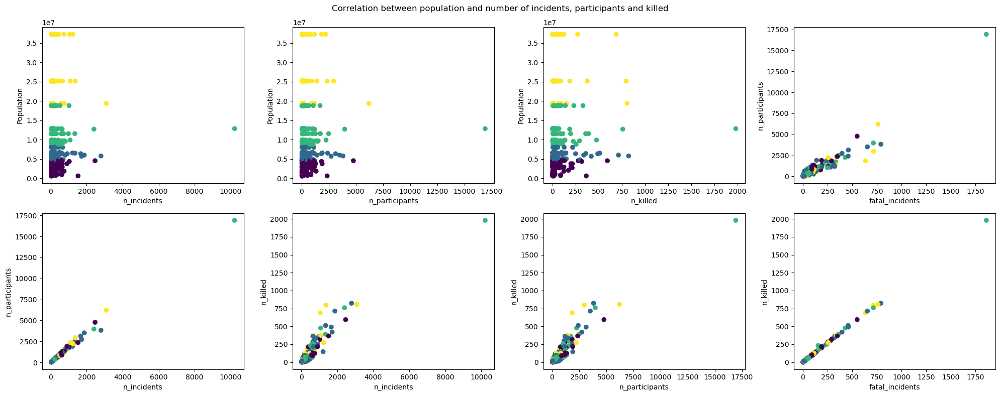

In [48]:
# make a plot to compare population, n_incidents, n_participants, n_killed,  population, fatal_incidents
fig, ax = plt.subplots(2, 4, figsize=(20, 8))
ax[0, 0].scatter(cities_df['n_incidents'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 0].set_xlabel('n_incidents')
ax[0, 0].set_ylabel('Population')
ax[0, 1].scatter(cities_df['n_participants'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 1].set_xlabel('n_participants')
ax[0, 1].set_ylabel('Population')
ax[0, 2].scatter(cities_df['n_killed'].values, cities_df['population_state_2010'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 2].set_xlabel('n_killed')
ax[0, 2].set_ylabel('Population')
ax[0, 3].scatter(cities_df['fatal_incidents'].values, cities_df['n_participants'].values, 
    c=cities_df['population_quantile'].values)
ax[0, 3].set_xlabel('fatal_incidents')
ax[0, 3].set_ylabel('n_participants')
ax[1, 0].scatter(cities_df['n_incidents'].values, cities_df['n_participants'].values,
    c=cities_df['population_quantile'].values)
ax[1, 0].set_xlabel('n_incidents')
ax[1, 0].set_ylabel('n_participants')
ax[1, 1].scatter(cities_df['n_incidents'].values, cities_df['n_killed'].values,
    c=cities_df['population_quantile'].values)
ax[1, 1].set_xlabel('n_incidents')
ax[1, 1].set_ylabel('n_killed')
ax[1, 2].scatter(cities_df['n_participants'].values, cities_df['n_killed'].values,
    c=cities_df['population_quantile'].values)
ax[1, 2].set_xlabel('n_participants')
ax[1, 2].set_ylabel('n_killed')
ax[1, 3].scatter(cities_df['fatal_incidents'].values, cities_df['n_killed'].values,
    c=cities_df['population_quantile'].values)
ax[1, 3].set_xlabel('fatal_incidents')
ax[1, 3].set_ylabel('n_killed')
fig.suptitle('Correlation between population and number of incidents, participants and killed')
fig.tight_layout();

Note that in the scatterplot:
- Purple represents the first quantile of the population of the state.
- Blue represents the second quantile.
- Green represents the third quantile.
- Yellow represents the fourth quantile.

We compute correlation values using Kendall correlation coefficient:

In [49]:
# correlation coefficient
cities_df[['n_incidents', 'n_participants', 'n_killed', 'population_state_2010', 'fatal_incidents']].corr('kendall')

,n_incidents,n_participants,n_killed,population_state_2010,fatal_incidents
n_incidents,1.000000,0.901945,0.579616,0.015550,0.585482
n_participants,0.901945,1.000000,0.611372,0.011675,0.616458
n_killed,0.579616,0.611372,1.000000,0.068313,0.965388
population_state_2010,0.015550,0.011675,0.068313,1.000000,0.071719
fatal_incidents,0.585482,0.616458,0.965388,0.071719,1.000000


## Clustering

We conduct clustering analysis on time series data utilizing various techniques. 

Our objective is to group cities with similar temporal patterns by leveraging the created time series and a predefined scoring mechanism. 

Following the clustering process, we analyze the results and extract motifs and anomalies from the time series data, aiming for a comprehensive understanding and exploration of the udata.

### Shape-based clustering
#### k-means

We utilize the k-means clustering algorithm on time series data, employing the TimeSeriesScalerMeanVariance object from the tslearn library for scaling. 

The clustering process is executed through the TimeSeriesKMeans method from the tslearn library, where we utilize the Dynamic Time Warping (DTW) distance as the metric. 
We set the maximum number of iterations to 100 to optimize the clustering results.

$DTW(X, Y) = \min_{\pi} \sqrt{\sum_{(i, j) \in \pi} d(x_i, y_j)^2}$

This equation defines the DTW distance between two time series, \(X\) and \(Y\), where \(\pi\) represents the alignment path, and \(d(x_i, y_j)\) is the local distance between corresponding elements \(x_i\) and \(y_j\). The DTW distance is the minimum cumulative distance along the optimal alignment path.

Using Dynamic Time Warping (DTW) as a metric requires longer computations compared to using the Euclidean distance, as their time complexity asymptotically differs. The Euclidean distance exhibits linear complexity, while DTW does not.

However, despite the increased computational cost, preliminary analysis indicates that using DTW yields better results. This justifies our choice to opt for DTW over the Euclidean distance.

Choose best k:

In [50]:
X = TimeSeriesScalerMeanVariance().fit_transform(incidents_by_city_df.values) # scale time series

In [51]:
inertia_list = [] # sum of distances of samples to their closest cluster center

for k in range(2, 20):
    km = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=100, random_state=42)
    km.fit(X)
    pred = km.predict(X)
    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", km.inertia_)
    inertia_list.append(km.inertia_)

'inertia_list = [] # sum of distances of samples to their closest cluster center\n\nfor k in range(2, 20):\n    km = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=100, random_state=42)\n    km.fit(X)\n    pred = km.predict(X)\n    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", km.inertia_)\n    inertia_list.append(km.inertia_)'

In [52]:
plt.figure(figsize=(20, 5))
plt.plot(inertia_list, '.--')
plt.xticks(range(len(inertia_list)), range(2, 20))
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia for different number of clusters');

"plt.figure(figsize=(20, 5))\nplt.plot(inertia_list, '.--')\nplt.xticks(range(len(inertia_list)), range(2, 20))\nplt.xlabel('Number of clusters')\nplt.ylabel('Inertia')\nplt.title('Inertia for different number of clusters');"

Fit chosen model (k=10):

In [53]:
best_k = 10
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=100, random_state=42)
km.fit(X)

TimeSeriesKMeans(max_iter=100, metric='dtw', n_clusters=10, random_state=42)

We visualize cluster's centroids:

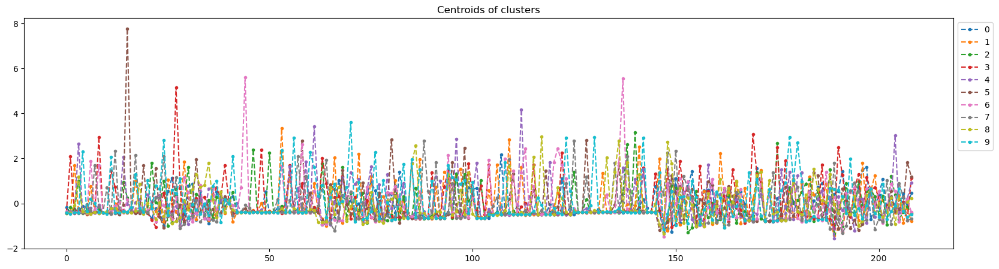

In [54]:
plt.figure(figsize=(20, 5))
plt.plot(km.cluster_centers_.reshape(incidents_by_city_df.values.shape[1], best_k), '.--')
plt.title('Centroids of clusters')
plt.legend(range(11), loc='upper left', bbox_to_anchor=(1, 1));

In [55]:
km.inertia_ # Sum of distances of samples to their closest cluster center

52.837655407936055

In [56]:
cluster = km.fit_predict(incidents_by_city_df.values)

Evaluate clustering:

In [57]:
results = kmeans_evaluation(X.reshape(X.shape[0], X.shape[1]), km, 
    cluster_centers=km.cluster_centers_.reshape(best_k, incidents_by_city_df.values.shape[1]))

cluster_results_df = pd.DataFrame(results, index=[0])
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10


Visualize clusters

In [58]:
cluster_df = incidents_df.groupby(['city', 'state'])[['latitude', 'longitude']].mean().reset_index()
cluster_df['cluster_kmeans'] = cluster
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans
0,Abilene,TEXAS,32.453319,-99.745577,7
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3


We visualize clusters on a map:

In [1049]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_kmeans'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

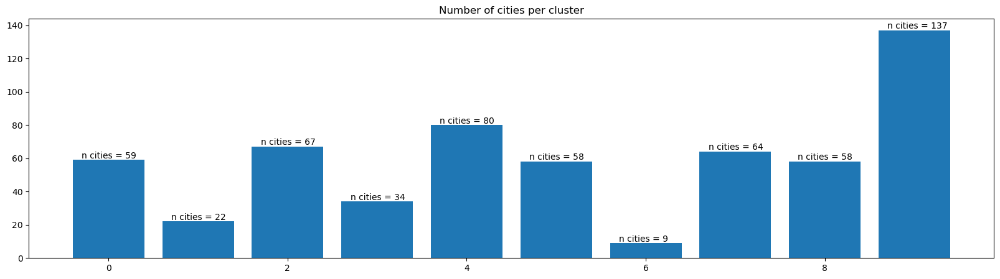

In [60]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_kmeans').size().index, cluster_df.groupby('cluster_kmeans').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_kmeans').size().values):
    plt.text(i-0.3, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

Visualize average of time series for each clusters:

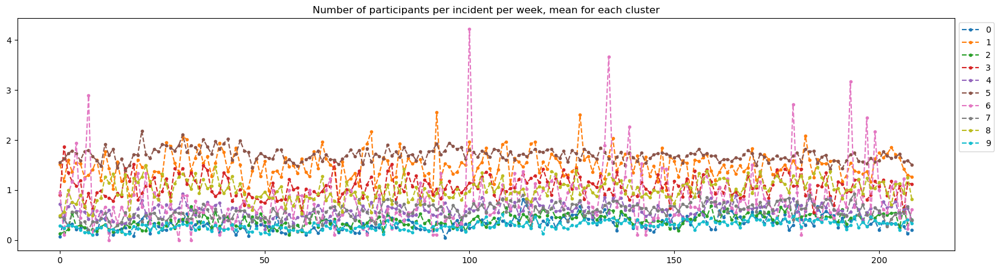

In [61]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df.groupby(cluster).mean().values.T, '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(cluster).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

Cluster 5: Higher values in time series indicate more incidents and involve a larger number of people.

Cluster 9: Lower values observed, likely representing cities with many zeros in the time series, i.e. fewer incidents.

Cluster 6: Time series in this cluster exhibit high variability with numerous fluctuations.

Cluster 1: Appears to contain time series with high values, although less pronounced than those in Cluster 5.

Visualize the time series belonging to Cluster 6 to better understand the high variability (y-axis is in logarithmic scale).

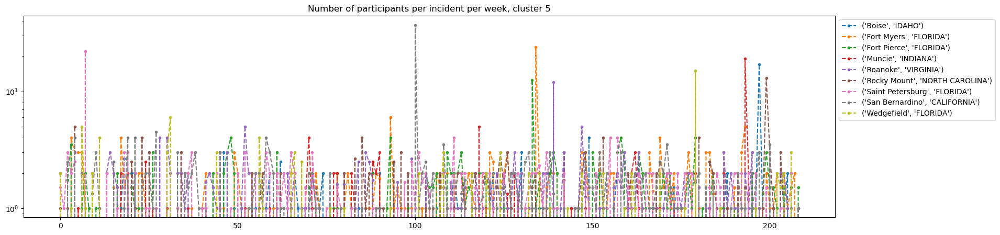

In [62]:
plt.figure(figsize=(20, 5))
plt.plot(incidents_by_city_df[cluster==6].values.T, '.--')
plt.title('Number of participants per incident per week, cluster 5')
plt.yscale('log')
plt.legend(incidents_by_city_df[cluster==6].index, loc='upper left', bbox_to_anchor=(1, 1));

In [63]:
cities_cluster_6 = incidents_by_city_df[cluster==6].index.get_level_values('city').to_list()
cities_df[cities_df.index.get_level_values('city').isin(cities_cluster_6)][
    ['n_incidents', 'n_incidents_quantile', 'n_participants', 'n_participants_avg', 'n_killed', 'n_killed_avg',
    'population_state_2010', 'population_quantile']].sort_values('n_incidents', ascending=False)

,,n_incidents,n_incidents_quantile,n_participants,n_participants_avg,n_killed,n_killed_avg,population_state_2010,population_quantile
city,state,,,,,,,,
San Bernardino,CALIFORNIA,197,3,380.0,1.928934,121.0,0.614213,37253956.0,3
Roanoke,VIRGINIA,176,3,301.0,1.710227,36.0,0.204545,8001024.0,1
Fort Myers,FLORIDA,160,2,310.0,1.937500,48.0,0.300000,18801310.0,2
Saint Petersburg,FLORIDA,159,2,299.0,1.880503,72.0,0.452830,18801310.0,2
Fort Pierce,FLORIDA,134,2,245.0,1.828358,35.0,0.261194,18801310.0,2
Rocky Mount,NORTH CAROLINA,100,2,193.0,1.930000,29.0,0.290000,9535483.0,2
Boise,IDAHO,73,2,124.0,1.698630,20.0,0.273973,1567582.0,0
Muncie,INDIANA,66,1,126.0,1.909091,12.0,0.181818,6483802.0,1
Wedgefield,FLORIDA,48,1,114.0,2.375000,18.0,0.375000,18801310.0,2


In [64]:
print('Averege number of participants per incident in the whole dataset: ', incidents_df['n_participants'].mean())
print('Averege number of killed people per incident in the whole dataset: ', incidents_df['n_killed'].mean())

Averege number of participants per incident in the whole dataset:  1.7991327517735312
Averege number of killed people per incident in the whole dataset:  0.26745527986151185


We can observe that almost all the time series in Cluster 6 are associated with cities where the average number of participants and killed is higher than the overall dataset average.

Visualize how the population, the total number of incidents over the four years, and the number of weeks in which at least one accidents is happened in a city are distributed across clusters.

In [65]:
def plot_categorical_features_per_cluster(labels, feature, feauture_name, ax):
    crosstab = pd.crosstab(labels, feature, rownames=['cluster'], colnames=[feauture_name])
    crosstab.plot.bar(ax=ax, stacked=False, title=f'Total number of {feauture_name} in the city quantile for each cluster')

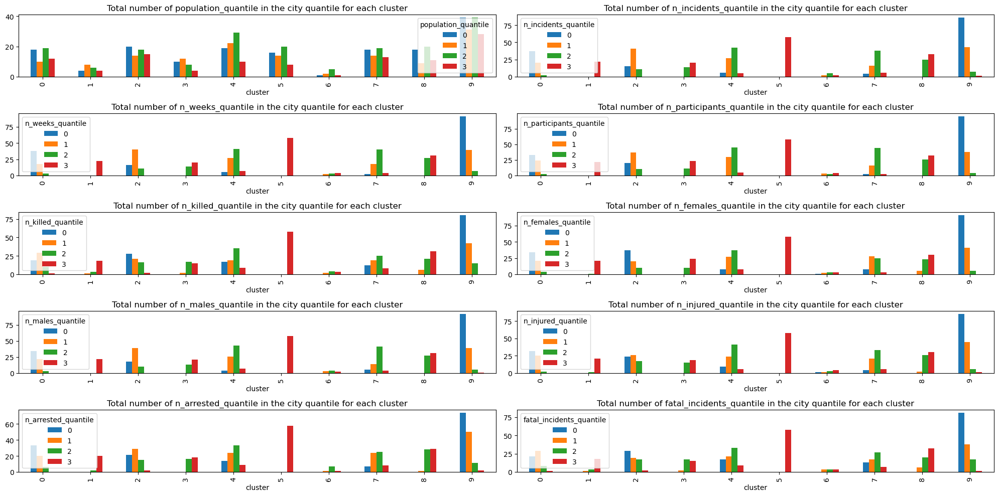

In [66]:
plt.subplots(5, 2, figsize=(20, 10))
for i, feature in enumerate(cities_categorical_features_list):
    plot_categorical_features_per_cluster(cluster, cities_df[feature], feature, plt.subplot(5, 2, i+1))
plt.tight_layout();

The population of the states to which the cities belong appears to be uniformly distributed across the clusters. 

Consistent with the earlier observation, in Cluster 5, only time series related to cities where the total number of participants in incidents and all the others features in which at least one incident occurred fall into the third quantile of the dataset with all the time series.

Within Cluster 9, the majority of cities are characterized by the number of participants in incidents and the number of weeks in which at least one incident occurred falling into the first quantile.

Cluster 1 conteins cities with features similar to cluster 5.

Performe the same cluster using time series with n_killed in order to compare the results.

In [67]:
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=100, random_state=42)
cluster_df['cluster_kmeans_killed'] = km.fit_predict(
    TimeSeriesScalerMeanVariance().fit_transform(incidents_killed_by_city_df.values))
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed
0,Abilene,TEXAS,32.453319,-99.745577,7,4
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4


In [68]:
sankey_plot(
    [cluster_df['cluster_kmeans'], cluster_df['cluster_kmeans_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison TimeSeriesKMeans'
)

From the Sankey plot, we can observe that there is no apparent correlation between the cluster analyses performed on the two distinct time series.

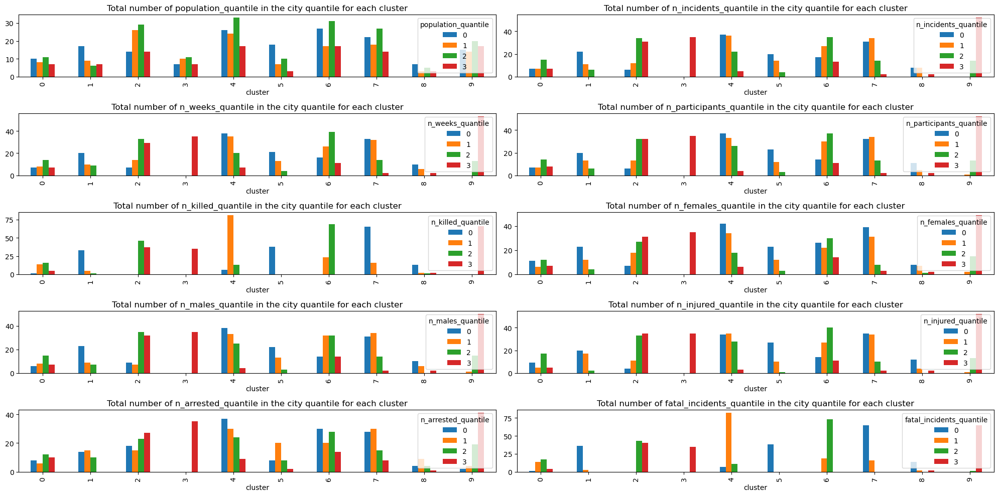

In [69]:
plt.subplots(5, 2, figsize=(20, 10))
for i, feature in enumerate(cities_categorical_features_list):
    plot_categorical_features_per_cluster(cluster_df['cluster_kmeans_killed'].to_list(), cities_df[feature], 
    feature, plt.subplot(5, 2, i+1))
plt.tight_layout();

We can observe that clusters 3 and 9 in this analysis contain features belonging to the third quantile. In fact, they correspond to the cities belonging to cluster 5 in the previous analysis.

### Compression-based Clustering

We perform clustering on compressed versions of time series data. 
The compression is achieved using the following custom dissimilarity measure *cdm_dist*:
- The values of each time series are concatenated into strings and encoded in UTF-8.
- The strings are then compressed using zlib compression.
- The dissimilarity is calculated as the ratio of the compressed size of the concatenated strings to the sum of the compressed sizes of the individual strings.

After defining the dissimilarity measure, we apply it to calculate pairwise distances between the rows of the reshaped matrix X. The resulting matrix M contains the dissimilarity values and is used for clustering.

This approach allows us to run clustering on the compressed representations of time series data.

In [70]:
def cdm_dist(x, y):
    # compounding dissimilarity measure
    x_str = (' '.join([str(v) for v in x.ravel()])).encode('utf-8')
    y_str = (' '.join([str(v) for v in y.ravel()])).encode('utf-8')
    return len(zlib.compress(x_str + y_str)) / (len(zlib.compress(x_str)) + len(zlib.compress(y_str)))

X = incidents_by_city_df.values
M = pairwise_distances(X.reshape(X.shape[0], X.shape[1]), metric=cdm_dist)

#### Hierarchical Clustering on Compressed Time Series

We conduct hierarchical clustering on compressed time series data using the AgglomerativeClustering algorithm from scikit-learn.

Before performing hierarchical clustering, we conduct a preliminary analysis to determine the appropriate linkage method and the suitable number of clusters.

We evaluate different linkage methods to find the one that best captures the relationships in the data. Common linkage methods include:
- Single Linkage
- Complete Linkage
- Average Linkage
- Ward Linkage

To identify the optimal number of clusters, we explore different cluster sizes. The dendrogram inspection was employed to guide the selection of the most suitable number of clusters.

In [71]:
algorithms = ["single", "complete", "average", "ward"]
linkages = []
distance_thresholds = []
dm = pdist(M, metric='euclidean')
for algorithm in algorithms:
    linkage_res = linkage(dm, method=algorithm, metric='euclidean', optimal_ordering=False)
    linkages.append(linkage_res)
    distance_thresholds.append(0.7 * max(linkage_res[:,2]))

In [72]:
def plot_dendrograms(linkages, algorithms, thresholds):
    _, axs = plt.subplots(ncols=len(linkages), figsize=(32,7))

    for i in range(len(linkages)):
        axs[i].set_title(algorithms[i])
        axs[i].set_xlabel('IncidentID or (Cluster Size)')
        axs[i].set_ylabel('Distance')
        axs[i].axhline(thresholds[i], ls='--', color='k', label='threshold')
        color_threshold = thresholds[i]
        dendrogram(linkages[i], truncate_mode="lastp", p=30, leaf_rotation=60, leaf_font_size=8,
                show_contracted=True, ax=axs[i], color_threshold=color_threshold)

    plt.suptitle(('Hierarchical Clustering Dendograms'), fontsize=18, fontweight='bold')
    plt.show()

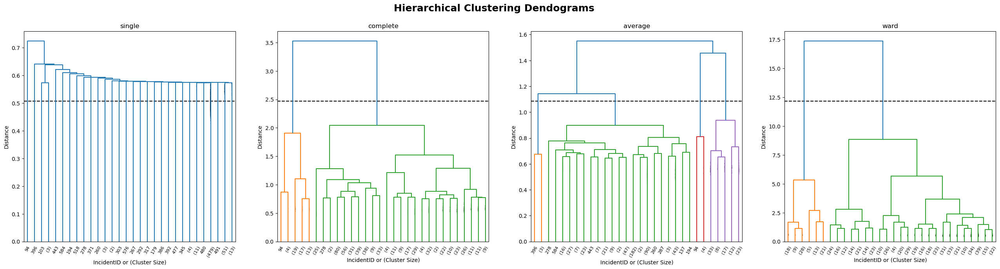

In [73]:
plot_dendrograms(linkages, algorithms, distance_thresholds)

We evaluate the clustering results using the cophenetic correlation coefficient:

In [74]:
cophenetic_coefs = []
for linkage in linkages:
    cophenetic_matrix = cophenet(linkage)
    cophenetic_coef = np.corrcoef(cophenetic_matrix, dm)[0][1]
    cophenetic_coefs.append(cophenetic_coef)
pd.DataFrame({'algorithm': algorithms, 'cophenetic_coef': cophenetic_coefs})

,algorithm,cophenetic_coef
0,single,0.692150
1,complete,0.789208
2,average,0.805292
3,ward,0.796847


The best results are obtained using average linkage.

Try using 4 clusters:

In [75]:
hier = AgglomerativeClustering(n_clusters=4, linkage='average')
hier.fit(M)

AgglomerativeClustering(linkage='average', n_clusters=4)

Visualize average of time series for each clusters:

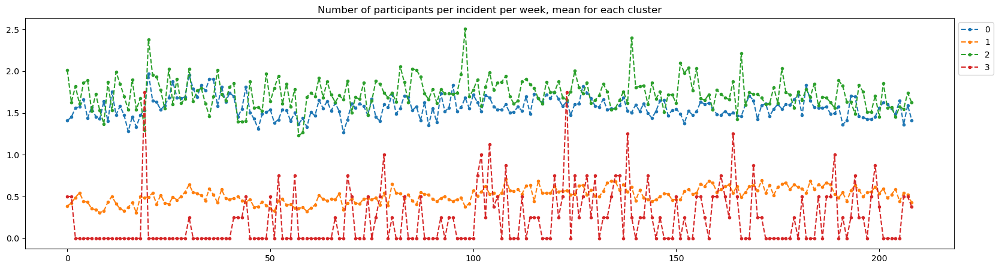

In [76]:
plt.figure(figsize=(20, 5))
for i in range(4):
    plt.plot(np.mean(X[np.where(hier.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(hier.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

Evalueate clusters:

In [77]:
results = hierarchical_evaluation(X.reshape(X.shape[0], X.shape[1]), hier)

cluster_results_df = pd.concat([cluster_results_df, pd.DataFrame(results, index=[1])])
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10.0
1,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.153092,NaN


In [78]:
cluster_df['cluster_hierarchical4'] = hier.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1


We visualize clusters on a map:

In [1050]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_hierarchical4'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

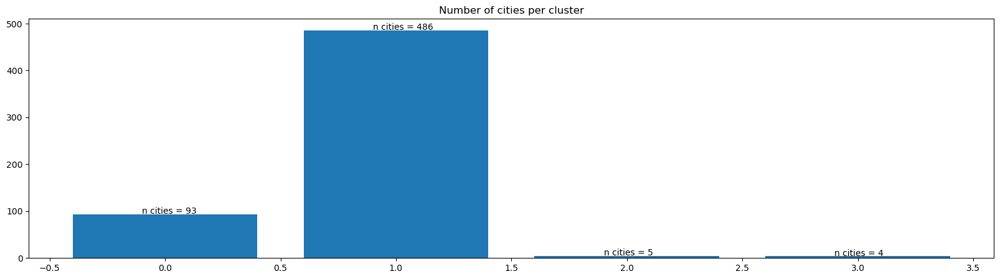

In [80]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_hierarchical4').size().index, cluster_df.groupby('cluster_hierarchical4').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_hierarchical4').size().values):
    plt.text(i-0.1, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

As observed, the majority of cities are clustered into Cluster 1. This clustering is highly imbalanced, with nearly all cities assigned to this single cluster. Such a clustering result may be considered ineffective or uninformative due to its lack of diversity across clusters

Use n_clusters = 6:

In [81]:
hier = AgglomerativeClustering(n_clusters=6, linkage='average')
hier.fit(M)

AgglomerativeClustering(linkage='average', n_clusters=6)

Visualize average of time series for each clusters:

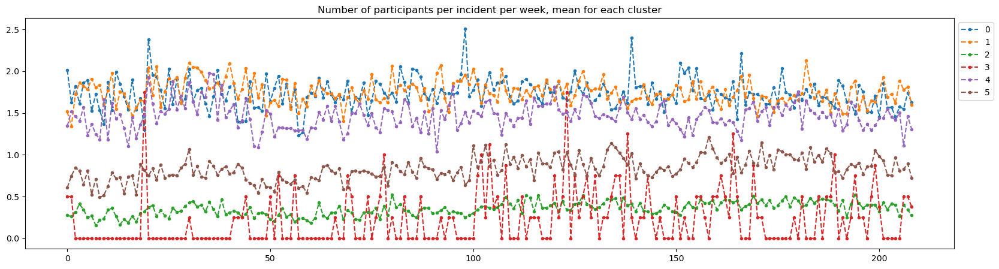

In [82]:
plt.figure(figsize=(20, 5))
for i in range(6):
    plt.plot(np.mean(X[np.where(hier.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(incidents_by_city_df.groupby(hier.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

In [83]:
results = hierarchical_evaluation(X.reshape(X.shape[0], X.shape[1]), hier)

cluster_results_df = pd.concat([cluster_results_df, pd.DataFrame(results, index=[2])])
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10.0
1,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.153092,NaN
2,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.126872,NaN


In [84]:
cluster_df['cluster_hierarchical6'] = hier.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4,cluster_hierarchical6
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1,5
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1,5


We visualize clusters on a map:

In [1051]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_hierarchical6'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Visualize the number of time series in each cluster:

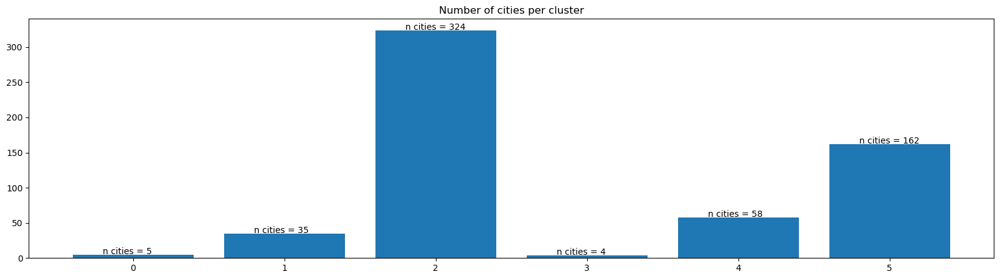

In [86]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_hierarchical6').size().index, cluster_df.groupby('cluster_hierarchical6').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_hierarchical6').size().values):
    plt.text(i-0.2, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

Visualize how the features relative at the cities over the four years are distributed across clusters.

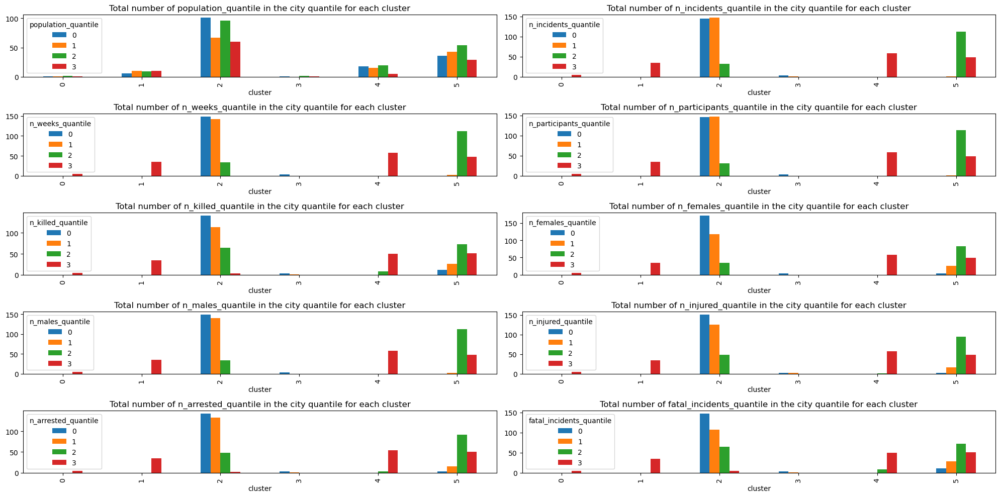

In [87]:
plt.subplots(5, 2, figsize=(20, 10))
for i, feature in enumerate(cities_categorical_features_list):
    plot_categorical_features_per_cluster(hier.labels_, cities_df[feature], feature, plt.subplot(5, 2, i+1))
plt.tight_layout();

In clusters 0, 1, and 4, there are cities where the number features falls within the third quartile concerning the total weeks in which incidents occurred in the dataset.

Cluster 2, the most populated ones, containe features distribuited in the first three quantiles.

Only 4 cities belong to Cluster 3, and all their features are in the first quantile.

In Cluster 5, there are cities with features that mostly fall into the second and third quantiles.

Performe the same cluster using time series with n_killed in order to compare the results.

In [88]:
hier = AgglomerativeClustering(n_clusters=6, linkage='average')
X = incidents_killed_by_city_df.values
hier.fit(pairwise_distances(X.reshape(X.shape[0], X.shape[1]), metric=cdm_dist))
cluster_df['cluster_hierarchical6_killed'] = hier.labels_

In [843]:
sankey_plot(
    [cluster_df['cluster_hierarchical6'], cluster_df['cluster_hierarchical6_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison Hierarchical Clustering on Compressed Time Series'
)

#### K-means using Piecewise Aggregate Approximation of time series

Piecewise Aggregate Approximation (PAA) is a technique used in time series analysis to reduce the dimensionality of a time series while preserving its essential characteristics.

PAA approximates a time-series $X$ of length $n$ into vector $\hat{X}=(\hat{x}_1,…,\hat{x}_M)$
 of any arbitrary length  $M\leq n$
 
$x_i = \frac{M}{n} \sum_{j=\frac{M}{n}(i-1)+1}^{\frac{M}{n}i} X_j$

We use PiecewiseAggregateApproximation from tslearn libraty.

In [90]:
n_paa_segments = 100
paa = PiecewiseAggregateApproximation(n_segments=n_paa_segments)
X_paa = paa.fit_transform(incidents_by_city_df.values) # PAA transformation

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\utils\utils.py:90: UserWarning:

2-Dimensional data passed. Assuming these are 588 1-dimensional timeseries



Visualize the PAA representation of time series:

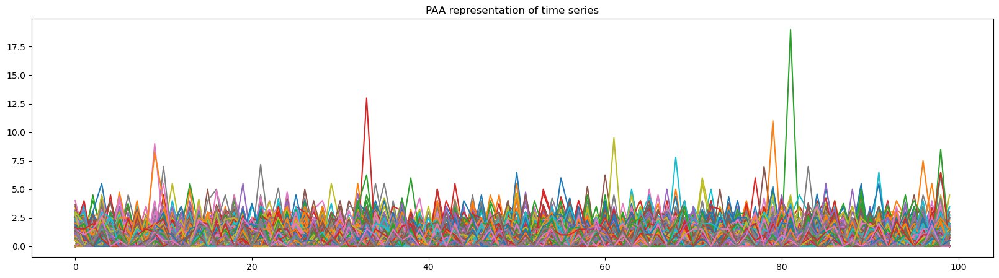

In [91]:
plt.figure(figsize=(20, 5))
plt.plot(X_paa.reshape(X_paa.shape[1], X_paa.shape[0]))
plt.title('PAA representation of time series');

Choose best k:

In [92]:
inertia_list = [] # sum of distances of samples to their closest cluster center

for k in range(2, 20):
    km = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=100, random_state=42)
    km.fit(X_paa)
    pred = km.predict(X_paa)
    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", km.inertia_)
    inertia_list.append(km.inertia_)"""

'inertia_list = [] # sum of distances of samples to their closest cluster center\n\nfor k in range(2, 20):\n    km = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=100, random_state=42)\n    km.fit(X_paa)\n    pred = km.predict(X_paa)\n    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", km.inertia_)\n    inertia_list.append(km.inertia_)'

In [93]:
plt.figure(figsize=(20, 5))
plt.plot(inertia_list, '.--')
plt.xticks(range(len(inertia_list)), range(2, 20))
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia for different number of clusters');

"plt.figure(figsize=(20, 5))\nplt.plot(inertia_list, '.--')\nplt.xticks(range(len(inertia_list)), range(2, 20))\nplt.xlabel('Number of clusters')\nplt.ylabel('Inertia')\nplt.title('Inertia for different number of clusters');"

Performe k-means clusternig on the PAA representation of time series, unsing the same paramters that in the previously experiment.

In [94]:
best_k = 9

In [95]:
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=100, random_state=42)
km.fit(X_paa)

TimeSeriesKMeans(max_iter=100, metric='dtw', n_clusters=9, random_state=42)

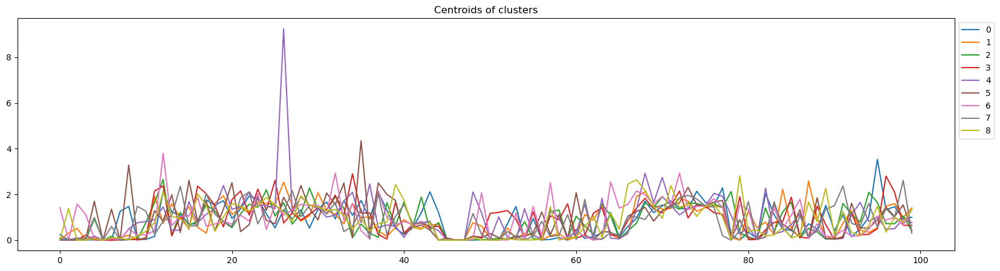

In [96]:
plt.figure(figsize=(20, 5))
plt.plot(km.cluster_centers_.reshape(X_paa.shape[1], best_k))
plt.title('Centroids of clusters')
plt.legend(range(11), loc='upper left', bbox_to_anchor=(1, 1));

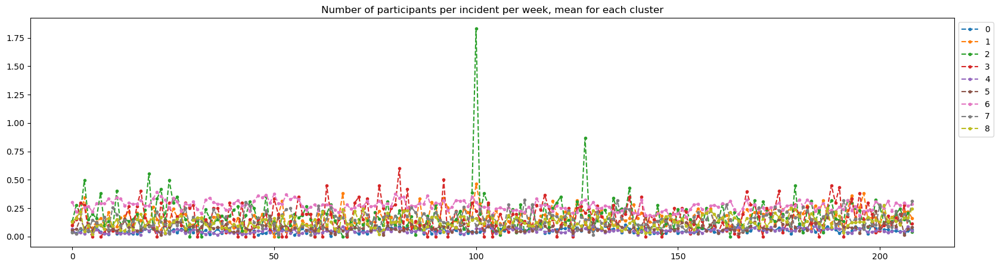

In [97]:
plt.figure(figsize=(20, 5))
for i in range(best_k):
    plt.plot(np.mean(X[np.where(km.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
#plt.yscale('log')
plt.legend(incidents_by_city_df.groupby(km.labels_).mean().index, loc='upper left', bbox_to_anchor=(1, 1));

In [98]:
results = kmeans_evaluation(X_paa.reshape(X_paa.shape[0], X_paa.shape[1]), km, 
    cluster_centers=km.cluster_centers_.reshape(best_k, X_paa.shape[1]))

cluster_results_df = pd.concat([cluster_results_df, pd.DataFrame(results, index=[3])])
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10.0
1,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.153092,NaN
2,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.126872,NaN
3,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",15.536405,31079.082947,6.966901,33.779215,0.010979,12.0


In [99]:
cluster_df['cluster_kmeans_paa'] = km.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4,cluster_hierarchical6,cluster_hierarchical6_killed,cluster_kmeans_paa
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1,5,0,4
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1,5,1,8


In [1052]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_kmeans_paa'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

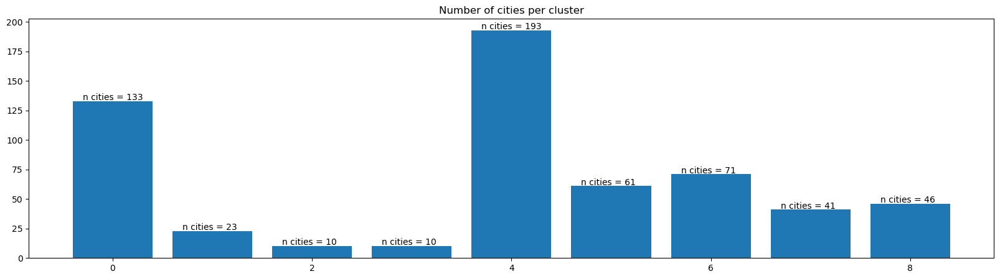

In [101]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_kmeans_paa').size().index, cluster_df.groupby('cluster_kmeans_paa').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_kmeans_paa').size().values):
    plt.text(i-0.3, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

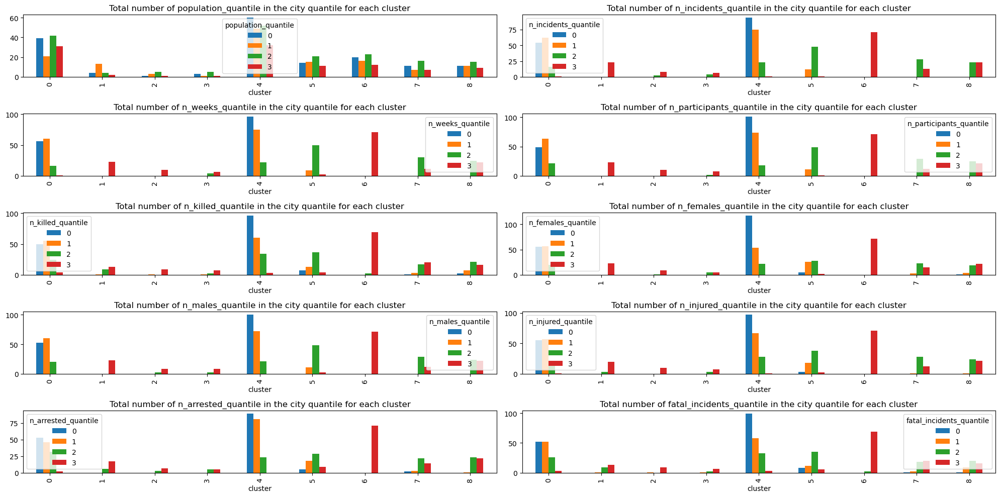

In [102]:
plt.subplots(5, 2, figsize=(20, 10))
for i, feature in enumerate(cities_categorical_features_list):
    plot_categorical_features_per_cluster(km.labels_, cities_df[feature], feature, plt.subplot(5, 2, i+1))
plt.tight_layout();

No cluster seems to exhibit a distinct pattern relative to the population.

Clusters 1, 2, 3, and 6 predominantly exhibit features belonging to the third quantile.

Clusters 4 and 0 have features distributed across the first three quantiles. Notably, Cluster 4, the most populous cluster, predominantly contains features from the first quantile.

(5, 2)


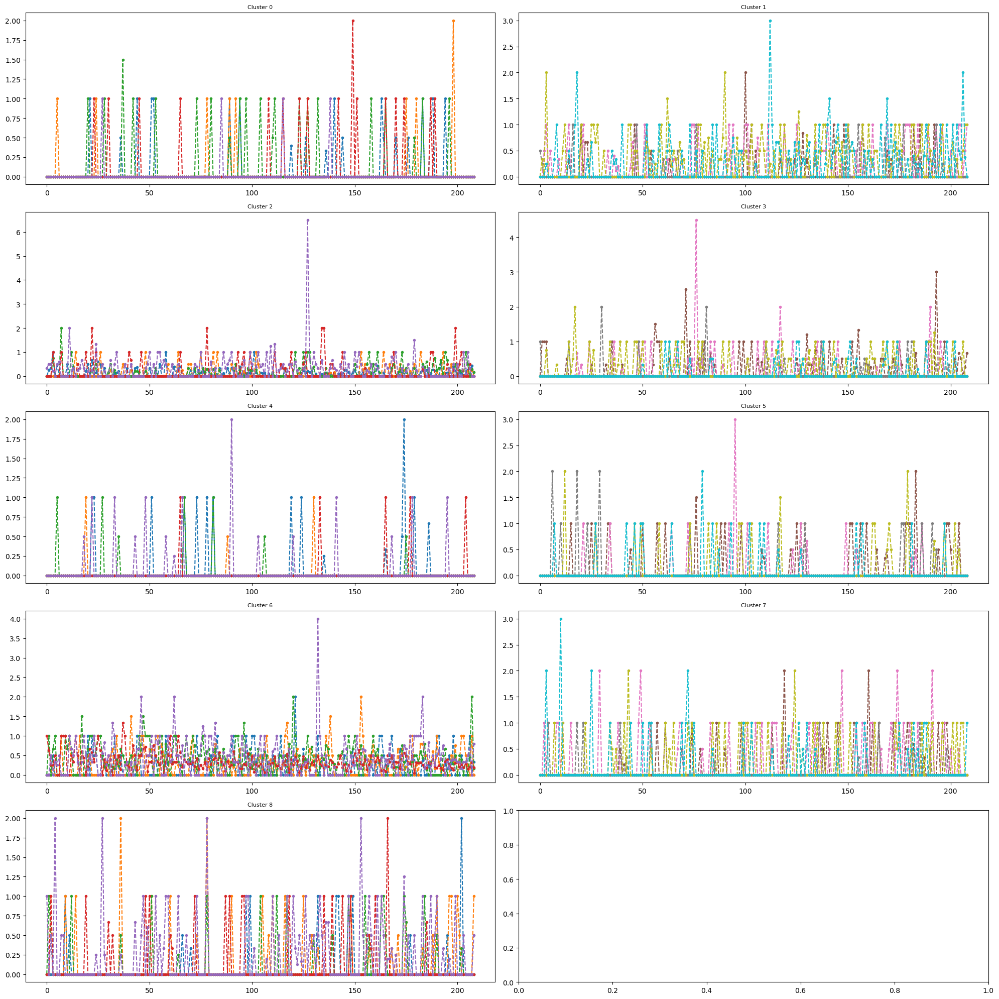

In [103]:
plot_timeseries_per_cluster(X, km.labels_)

In [104]:
paa = PiecewiseAggregateApproximation(n_segments=100)
X_paa = paa.fit_transform(incidents_killed_by_city_df.values) # PAA transformation
km = TimeSeriesKMeans(n_clusters=best_k, metric="dtw", max_iter=5, random_state=0)
km.fit(X_paa)
cluster_df['cluster_kmeans_paa_killed'] = km.labels_

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\utils\utils.py:90: UserWarning:

2-Dimensional data passed. Assuming these are 588 1-dimensional timeseries



In [105]:
sankey_plot(
    [cluster_df['cluster_kmeans_paa'], cluster_df['cluster_kmeans_paa_killed']],
    labels_titles=['n_participants', 'n_killed'],
    title='Clusterings comparison KMeansTimeSeries PAA'
)

No discernible pattern emerges between the clusters formed using time series generated based on the number of participants and those formed using the number of killed incidents.

### Features-based Clustering

#### K-mean

Create list of features conteined statistical values for each time series:

In [106]:
def calculate_features(values):
    features = {
        'avg': np.mean(values),
        'std': np.std(values),
        'var': np.var(values),
        'med': np.median(values),
        '10p': np.percentile(values, 10),
        '25p': np.percentile(values, 25),
        '50p': np.percentile(values, 50),
        '75p': np.percentile(values, 75),
        '90p': np.percentile(values, 90),
        'iqr': np.percentile(values, 75) - np.percentile(values, 25),
        'cov': 1.0 * np.mean(values) / np.std(values),
        'skw': stats.skew(values),
        'kur': stats.kurtosis(values)
    }

    return features

In [107]:
X = incidents_by_city_df.values
time_series_features_list = [list(calculate_features(x).values())[:-2] for x in X]

In [ ]:
inertia_list = [] # sum of distances of samples to their closest cluster center

for k in range(2, 30):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(time_series_features_list)
    pred = kmeans.predict(time_series_features_list)
    print("n clusters = ", k, "\t Clusters =", np.unique(pred,return_counts=True)[1], "\t Inertia =", kmeans.inertia_)
    inertia_list.append(kmeans.inertia_)

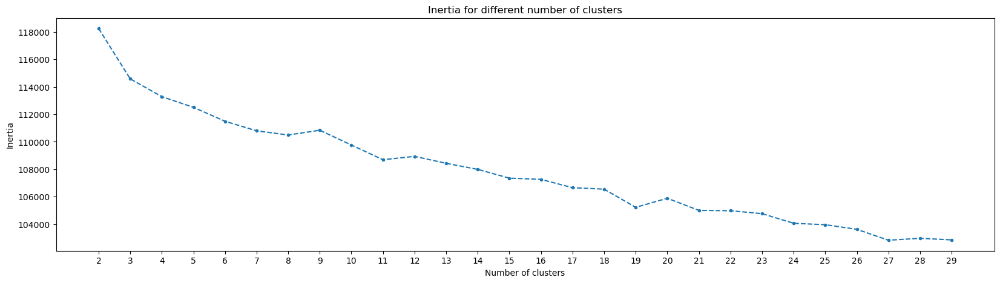

In [109]:
plt.figure(figsize=(20, 5))
plt.plot(inertia_list, '.--')
plt.xticks(range(len(inertia_list)), range(2, 30))
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia for different number of clusters');

Apply clustering algorithm to the statistical features list:

In [110]:
best_k=11

In [111]:
kmeans = KMeans(n_clusters=best_k, n_init=10, random_state=42)
kmeans.fit(time_series_features_list)

c:\Users\giuli\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



KMeans(n_clusters=11, n_init=10, random_state=42)

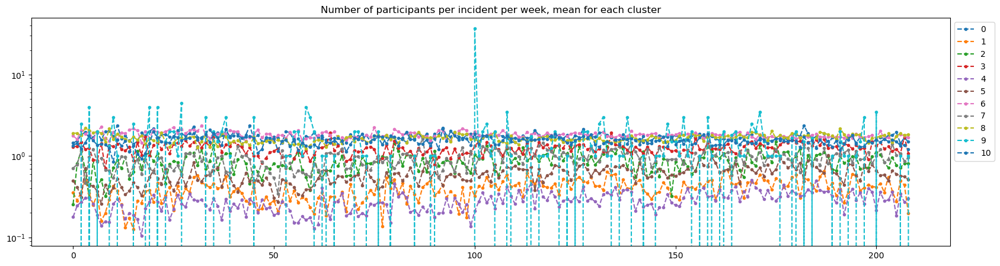

In [112]:
plt.figure(figsize=(20, 5))
for i in range(best_k):
    plt.plot(np.mean(X[np.where(kmeans.labels_ == i)[0]], axis=0), '.--')
plt.title('Number of participants per incident per week, mean for each cluster')
plt.legend(range(best_k), loc='upper left', bbox_to_anchor=(1, 1));
plt.yscale('log')
plt.show()

In [113]:
results = kmeans_evaluation(np.array(time_series_features_list), kmeans, cluster_centers=kmeans.cluster_centers_)

cluster_results_df = pd.concat([cluster_results_df, pd.DataFrame(results, index=[4])])
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10.0
1,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.153092,NaN
2,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.126872,NaN
3,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",15.536405,31079.082947,6.966901,33.779215,0.010979,12.0
4,"KMeans(n_clusters=11, n_init=10, random_state=42)",120.493235,2032.008983,0.669321,973.058098,0.580864,8.0


In [114]:
cluster_df['cluster_kmeans_features'] = kmeans.labels_
cluster_df.head(2)

,city,state,latitude,longitude,cluster_kmeans,cluster_kmeans_killed,cluster_hierarchical4,cluster_hierarchical6,cluster_hierarchical6_killed,cluster_kmeans_paa,cluster_kmeans_paa_killed,cluster_kmeans_features
0,Abilene,TEXAS,32.453319,-99.745577,7,4,1,5,0,4,0,5
1,Aiken,SOUTH CAROLINA,33.558603,-81.716797,3,4,1,5,1,8,8,2


In [1053]:
fig = px.scatter_mapbox(
    lat=cluster_df['latitude'],
    lon=cluster_df['longitude'],
    zoom=2, 
    color=cluster_df['cluster_kmeans_features'],
    height=400,
    width=1000,
    text=cluster_df['city'] + ', ' + cluster_df['state']
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

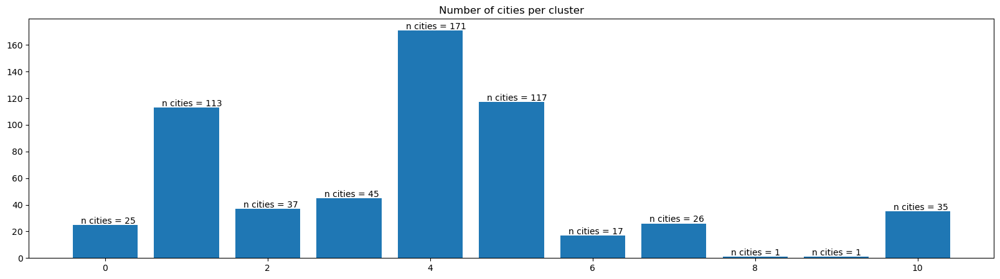

In [116]:
plt.figure(figsize=(20, 5))
plt.bar(cluster_df.groupby('cluster_kmeans_features').size().index, cluster_df.groupby('cluster_kmeans_features').size().values)
for i, v in enumerate(cluster_df.groupby('cluster_kmeans_features').size().values):
    plt.text(i-0.3, v+1, 'n cities = '+str(v))
plt.title('Number of cities per cluster');

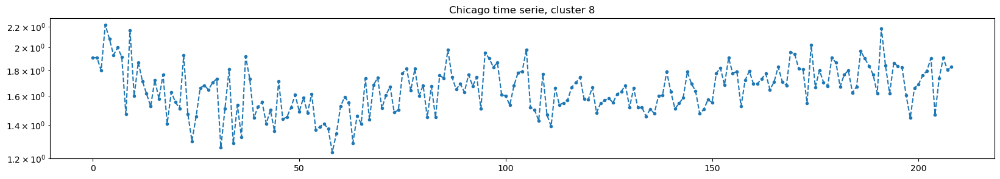

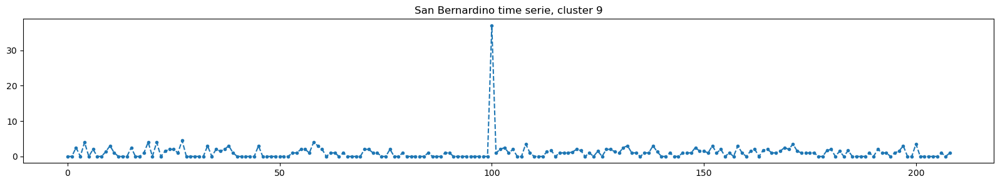

In [117]:
plt.figure(figsize=(20, 3))
plt.plot(X[kmeans.labels_==8].T, '.--')
plt.title(incidents_by_city_df[kmeans.labels_==8].index.get_level_values('city').values[0]+' time serie, cluster 8')
plt.yscale('log');

plt.figure(figsize=(20, 3))
plt.plot(X[kmeans.labels_==9].T, '.--')
plt.title(incidents_by_city_df[kmeans.labels_==9].index.get_level_values('city').values[0]+' time serie, cluster 9');

In [118]:
incidents_by_city_df[kmeans.labels_==8].index

MultiIndex([('Chicago', 'ILLINOIS')],
           names=['city', 'state'])

In [119]:
incidents_by_city_df[kmeans.labels_==9].index

MultiIndex([('San Bernardino', 'CALIFORNIA')],
           names=['city', 'state'])

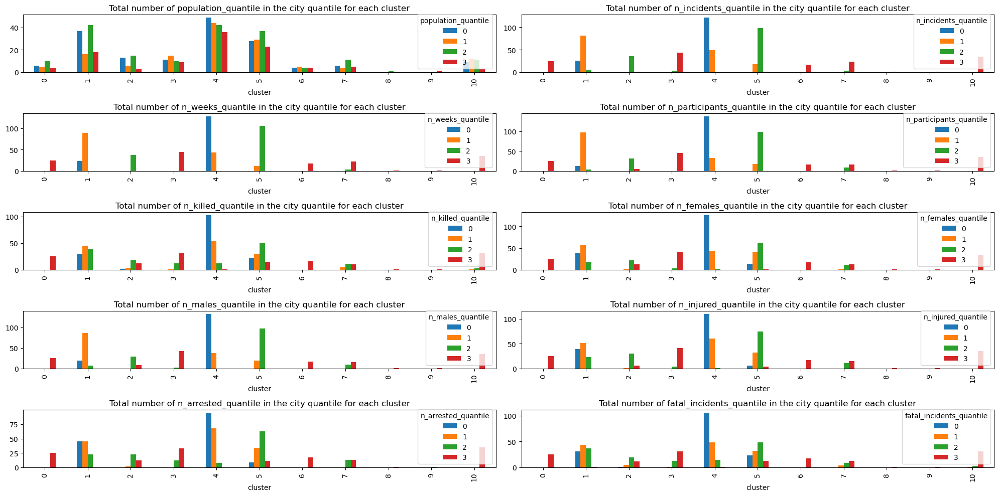

In [120]:
plt.subplots(5, 2, figsize=(20, 10))
for i, feature in enumerate(cities_categorical_features_list):
    plot_categorical_features_per_cluster(kmeans.labels_, cities_df[feature], feature, plt.subplot(5, 2, i+1))
plt.tight_layout();

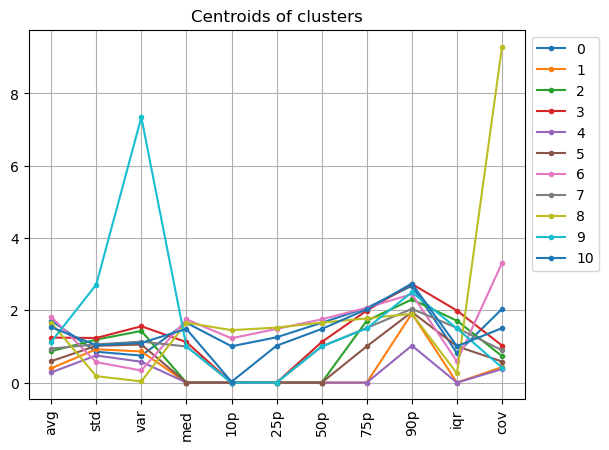

In [844]:
#plt.figure(figsize=(1, 7))
plt.plot(kmeans.cluster_centers_.T, '.-')
plt.title('Centroids of clusters')
plt.xticks(range(len(time_series_features_list[0])), list(calculate_features(X[0]).keys())[:-2], rotation=90)
plt.grid()
plt.legend(range(best_k), loc='upper left', bbox_to_anchor=(1, 1));

In [122]:
# time series without zeros
incidents_by_city_df[np.count_nonzero(incidents_by_city_df.values, axis=1) == 209].index

MultiIndex([(         'Chicago',  'ILLINOIS'),
            ('City of New York',  'NEW YORK'),
            (        'Columbus',      'OHIO'),
            (       'Milwaukee', 'WISCONSIN'),
            (     'New Orleans', 'LOUISIANA')],
           names=['city', 'state'])

In [123]:
# print cluster for 
list_index = [('Chicago','ILLINOIS'), ('City of New York','NEW YORK'),
    ('Columbus','OHIO'), ('Milwaukee','WISCONSIN'), ('New Orleans','LOUISIANA')]
for index in list_index:
    print(index, kmeans.labels_[incidents_by_city_df.index == index][0])

('Chicago', 'ILLINOIS') 8
('City of New York', 'NEW YORK') 6
('Columbus', 'OHIO') 6
('Milwaukee', 'WISCONSIN') 6
('New Orleans', 'LOUISIANA') 6


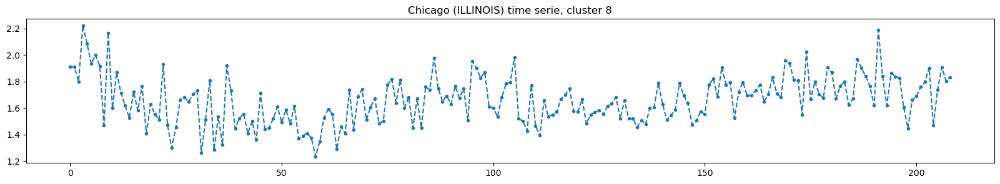

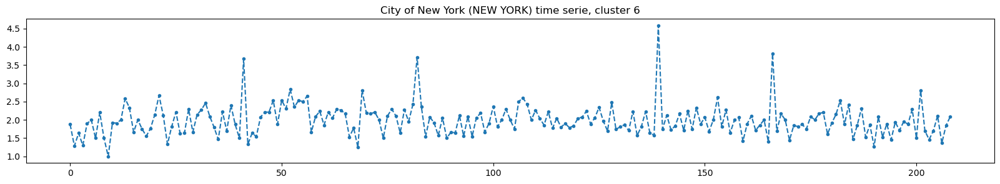

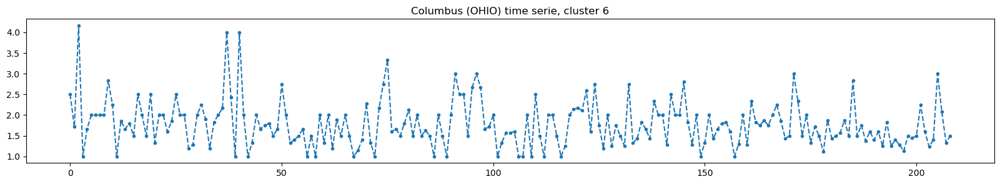

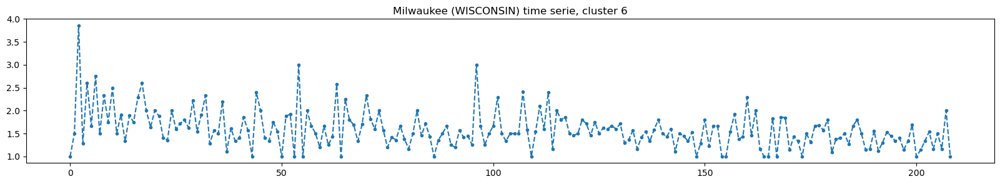

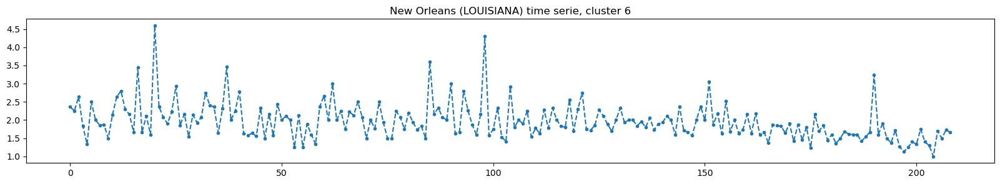

In [124]:
# plot time series for list_index

for index in list_index:
    plt.figure(figsize=(20, 3))
    plt.plot(incidents_by_city_df[incidents_by_city_df.index == index].values.T, '.--')
    plt.title(index[0]+' ('+index[1]+') time serie, cluster '+str(kmeans.labels_[incidents_by_city_df.index == index][0]))

Extrapolate incidents correspondig to peak data for San bernardino time series:

In [285]:
def week_to_date(week):
    return datetime.datetime.strptime('2013-12-30', '%Y-%m-%d') + datetime.timedelta(weeks=week)

def date_to_week(date):
    return (pd.to_datetime(date) - pd.to_datetime('2013-12-30')).days // 7

In [257]:
week = np.where(np.max(incidents_by_city_df[kmeans.labels_==9].values.T) == incidents_by_city_df[kmeans.labels_==9].values.T)[0][0]
start_date = week_to_date(int(week))
end_date = start_date + 6*datetime.timedelta(days=1)
print('Peak week: ', week, 'corresponding to ', start_date, ' - ', end_date)

Peak week:  100 corresponding to  2015-11-30 00:00:00  -  2015-12-06 00:00:00


In [242]:
incidents_df[(incidents_df['city'] == 'San Bernardino') & (incidents_df['state'] == 'CALIFORNIA') &
    (incidents_df['date'] >= start_date) & (incidents_df['date'] <= end_date)][['date', 'n_participants', 'n_killed',
    'n_injured', 'n_arrested', 'n_unharmed', 'avg_age_participants', 'incident_characteristics1', 'incident_characteristics2']]

,date,n_participants,n_killed,n_injured,n_arrested,n_unharmed,avg_age_participants,incident_characteristics1,incident_characteristics2
21965,2015-12-02,37.0,16.0,19.0,0.0,0.0,38.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"


[San Bernardino attack](https://en.wikipedia.org/wiki/2015_San_Bernardino_attack)
*"On December 2, 2015, a terrorist attack, consisting of a mass shooting and an attempted bombing, occurred at the Inland Regional Center in San Bernardino, California. The perpetrators, Syed Rizwan Farook and Tashfeen Malik, a married couple living in the city of Redlands."*

[North Park Elementary School shooting](https://en.wikipedia.org/wiki/2017_North_Park_Elementary_School_shooting)
*"On April 10, 2017, a shooting occurred inside a special education classroom at North Park Elementary School in San Bernardino, California.
The shooting followed a terrorist attack that occurred in San Bernardino in December 2015."*

In [275]:
incidents_df[(incidents_df['city'] == 'San Bernardino') & (incidents_df['state'] == 'CALIFORNIA') & 
    (incidents_df['date'] == '2017-04-10')][['date', 'n_participants', 'n_killed',
    'n_injured', 'n_arrested', 'n_unharmed', 'avg_age_participants', 'incident_characteristics1', 'incident_characteristics2']]

,date,n_participants,n_killed,n_injured,n_arrested,n_unharmed,avg_age_participants,incident_characteristics1,incident_characteristics2
179170,2017-04-10,4.0,3.0,1.0,0.0,0.0,31.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"


In [288]:
# cluster of incidents incidents_df[(incidents_df['city'] == 'San Bernardino') & (incidents_df['state'] == 'CALIFORNIA') & (incidents_df['date'] == '2017-04-10')]
week_north_parck_attack = date_to_week('2017-04-10')
week_north_parck_attack

171

Cardinality of non zero values for time series:

In [125]:
print('Cardinality of non zero values for time series in cluster 6: ',
    np.count_nonzero(incidents_by_city_df[kmeans.labels_==6].values, axis=1))
print('Cardinality of non zero values for time series in cluster 0: ',
    np.count_nonzero(incidents_by_city_df[kmeans.labels_==0].values, axis=1))

Cardinality of non zero values for time series in cluster 6:  [205 209 203 209 206 207 204 206 208 207 209 209 208 207 203 201 206]
Cardinality of non zero values for time series in cluster 0:  [198 196 188 199 195 202 200 194 194 199 202 205 194 192 193 201 192 195
 199 191 194 191 190 190 190]


In [126]:
print('Cardinality of non zero values for time series in cluster 2: ',
    np.count_nonzero(incidents_by_city_df[kmeans.labels_==2].values, axis=1))
print('Mean cardinality of non zero values for time series in cluster 2: ',
    np.mean(np.count_nonzero(incidents_by_city_df[kmeans.labels_==2].values, axis=1)))
print('Cardinality of non zero values for time series in cluster 7: ',
    np.count_nonzero(incidents_by_city_df[kmeans.labels_==7].values, axis=1))
print('Mean cardinality of non zero values for time series in cluster 7: ',
    np.mean(np.count_nonzero(incidents_by_city_df[kmeans.labels_==7].values, axis=1)))

Cardinality of non zero values for time series in cluster 2:  [ 92  97  84 100  90  88  99  97 103  98  82  99 104  87  99  94 103  76
  89 100 104  94 104  91  91  97  89 102  96  75 102  85  86 100  97  82
 104]
Mean cardinality of non zero values for time series in cluster 2:  94.05405405405405
Cardinality of non zero values for time series in cluster 7:  [112 114 132 117 111 118 115 112 121 105 144 112 113 112 132 118 107 138
 110 114 118 131 125 134 110 112]
Mean cardinality of non zero values for time series in cluster 7:  118.73076923076923


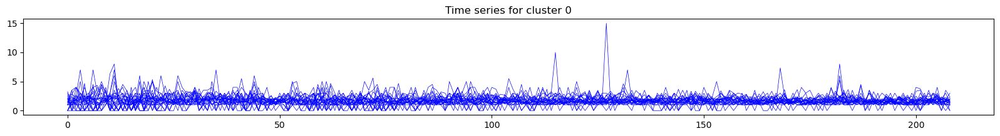

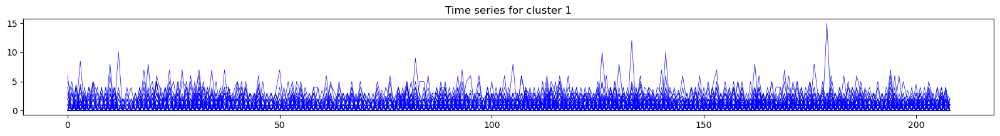

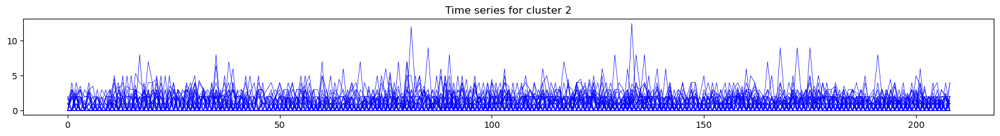

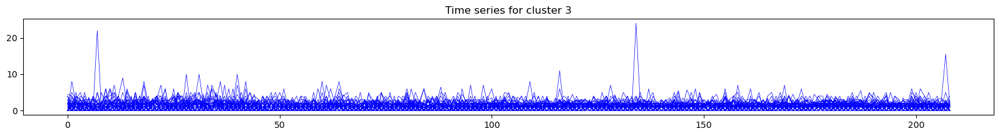

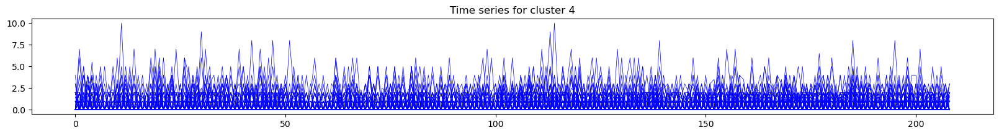

...

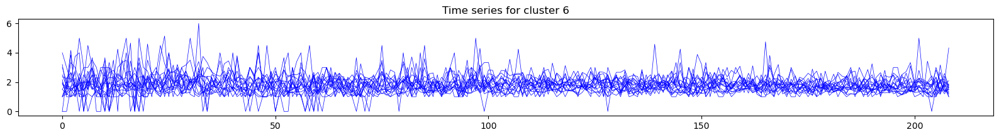

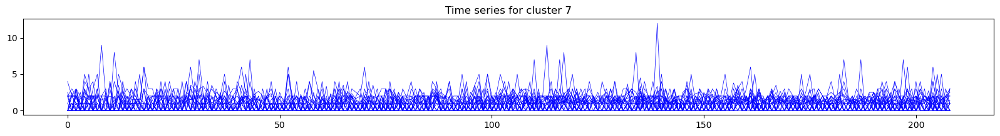

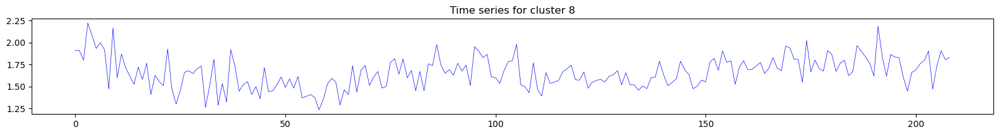

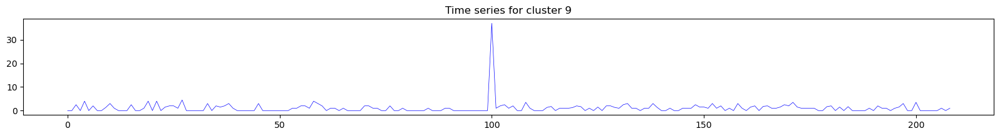

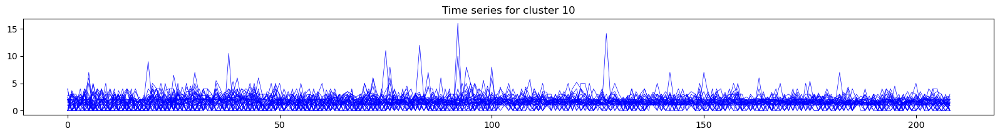

In [127]:
# plot all the time series for each cluster
color = ['b', 'g', 'r', 'c', 'm', 'y', 'tab:green', 'tab:purple', 'tab:orange', 'k', 'tab:pink']
for i in range(best_k):
    plt.figure(figsize=(20, 2))
    plt.plot(incidents_by_city_df[kmeans.labels_==i].values.T, 'b', linewidth=0.5)
    plt.title('Time series for cluster '+str(i));


Clustering results:

There is no discernible pattern in cluster division based on population size.

Clusters 0, 6, 8, 9, and 10 are primarily composed of cities exhibiting features (total number of incidents, number of week in which at least one incidents is present, sum of the number of killed person, females, males injured person and arrested during all the incidents occured in a city) predominantly situated in the third quantile. The mean values of their respective time series consistently surpass others across all time points, signifying time series characterized by fewer zero values. In essence, these clusters encapsulate cities where incidents occur in most weeks.

Clusters 8 and 9 each consist of a single city: Chicago (ILLINOIS) and San Bernardino (CALIFORNIA), respectively. Despite attempts to reduce the number of clusters to 9 and eliminate the cluster with only one city, this adjustment proved unsuccessful, as the two clusters with a singular city persisted, and larger clusters absorbed them.

San Bernardino time serie displays a peak in its time series (value=37), representing the maximum number of participants in incidents within a specific week in any city throughout the entire dataset. Excluding this value, the time series exhibits a significant number of null values (94 out of 209). The mean of its values is 1.125. If we disregard the value 37, the series would share characteristics similar to those belonging to Cluster 4.

Chicago stands out with a time series entirely devoid of null values. The only other cities sharing this characteristic and their respective clusters are as follows: City of New York (NEW YORK), Columbus (OHIO), Milwaukee (WISCONSIN), and New Orleans (LOUISIANA), all this cities are clustering into Cluster 6.

Chicago's time series is more regular, with values ranging between 1.2 and 2.2, presenting a relatively constant trend over time. In contrast, time series in Cluster 6 exhibit a more irregular pattern, covering a broader range of values (1-4.5).

In contrast, time series in Cluster 6 exhibit a more irregular pattern, covering a broader range of values (1-4.5).
Cluster 6 encompasses 17 time series, characterized by a range in the cardinality of non-zero value between 201 to 209 out of 209.
Cluster 0 contains time series with characteristics similar to those in Cluster 6. However, the number of non-zero values is slightly lower, ranging between 201 to 209 out of 209.

Clusters 2 and 7 consist of cities associated with features primarily falling above the second quantile. With the exception of the number of fatal incidents, these cities experience a higher-than-average number of incidents throughout the years, with a higher number of participants per incident. However, the average number of incidents with at least one fatality is lower on average compared to cities clustered in Clusters 0, 6, 8, and 10.
The main distinction between the two clusters lies in the number of non-zero values. For Cluster 2, this number ranges between 89 to 104, with a mean of 94.054. On the other hand, for Cluster 7, it ranges between 107 to 134 out of 209, with a mean of 118.731.

Clusters 1 and 4, the second and first most populated clusters, predominantly include cities with features mostly belonging to the first two quantiles. Specifically, in Cluster 4, cities mostly have features in the first quantile, indicating time series associated with many null values.

Cluster 3 contains features predominantly in the third quantile, and it is the third-largest cluster.

Cluster 5 features predominantly fall within the second and third quantiles, making it the third-largest cluster.

### Clustering comparison

In [128]:
sankey_plot(
    [cluster_df['cluster_kmeans'], cluster_df['cluster_kmeans_paa'], cluster_df['cluster_hierarchical6'], 
    cluster_df['cluster_hierarchical4'], cluster_df['cluster_kmeans_features']],
    labels_titles=['TimeSeriesKMeans Shape-based', 'TimeSeriesKMeans PAA', 'Hierarchical Compression-based', 
    'Hierarchical Compression-based', 'KMeans Features-based'],
    title='Clusterings comparison'
)

In [129]:
cluster_results_df

,model,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
0,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",53.082406,147456.201457,11.717847,1.081027,-0.009272,10.0
1,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.153092,NaN
2,"AgglomerativeClustering(linkage='average', n_c...",NaN,NaN,NaN,NaN,-0.126872,NaN
3,"TimeSeriesKMeans(max_iter=100, metric='dtw', n...",15.536405,31079.082947,6.966901,33.779215,0.010979,12.0
4,"KMeans(n_clusters=11, n_init=10, random_state=42)",120.493235,2032.008983,0.669321,973.058098,0.580864,8.0


**Shape-based Clustering (K-means):**

In the results obtained from shape-based clustering using k-means, we observe distinct patterns across different clusters:

- **Cluster 5:** Time series with higher values, indicating more incidents and involving a larger number of people.
- **Cluster 9:** Lower values, likely representing cities with many zeros in the time series, i.e., fewer incidents.
- **Cluster 6:** High variability with numerous fluctuations in time series.
- **Cluster 1:** Contains time series with high values, though less pronounced than those in Cluster 5.

The population distribution of the states to which the cities belong seems uniformly distributed across the clusters. Notably, in Cluster 5, time series relate to cities where various features, including the total number of participants in incidents, fall into the third quantile of the dataset. Within Cluster 9, the majority of cities exhibit characteristics falling into the first quantile.

**Hierarchical Clustering on Compressed Time Series:**

The hierarchical clustering algorithm yields different results when clustering similar time series obtained using n_killed. When using 4 clusters, an imbalanced result is observed, with the majority of cities assigned to Cluster 1, indicating a lack of diversity. With 6 clusters, the distribution improves, and specific patterns emerge:

- **Clusters 0, 1, and 4:** Cities where features fall within the third quartile concerning the total weeks of incidents in the dataset.
- **Cluster 2:** The most populated cluster, with features distributed across the first three quantiles.
- **Cluster 5**: Cities with features that mostly fall into the second and third quantiles.

This is the only clustering algorithm in which the results reveal a pattern between the clusters formed using time series generated based on the number of participants and those formed using the number of killed incidents.

**K-means using Piecewise Aggregate Approximation (PAA) of Time Series:**

The k-means clustering based on PAA does not reveal a distinct pattern relative to the population. Key observations include:

- **Clusters 1, 2, and 6** predominantly exhibit features belonging to the third quantile.
- **Clusters 4 and 0** have features distributed across the first three quantiles, with Cluster 4, the most populous, containing predominantly first quantile features.
- Only 4 cities belong to **Cluster 3**, and all their features fall into the first quantile.

**Features-based Clustering (K-means):**
This clustering algorithm performs relatively better. See before for more comment.

## Matrix profile

The matrix profile is constructed by combining distance profiles for all possible subsequence pairs in the time series. It highlights repeated patterns or motifs by identifying low values in the matrix profile.

We use matrixprofile-ts library for evaluating time series data using the Matrix Profile algorithms.

The Matrix Profile value jumps at each phase change. High Matrix Profile values are associated with "discords": time series behavior that hasn't been observed before.
Repeated patterns in the data (or "motifs") lead to low Matrix Profile values.

Compute and visualize matrix profile (a data structure that annotates time series by using a sliding window to compare the pairwise distance among the subsequences) for New York, Los Angeles and Chicago:

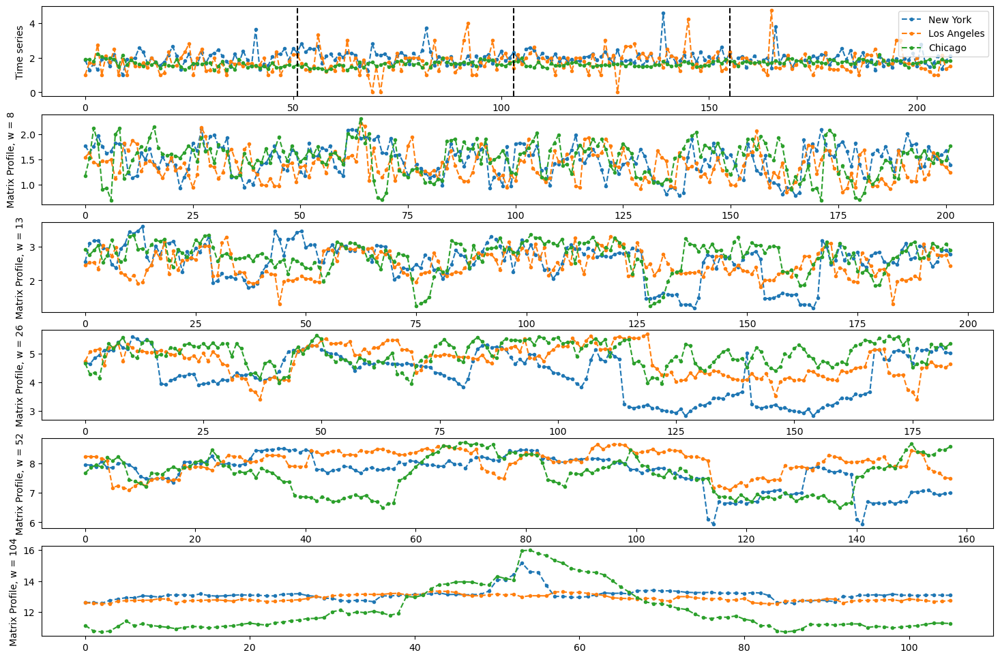

In [130]:
# estrapolate time series for new york, los angeles and chicago
new_york_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'City of New York')].values[0]
los_angeles_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Los Angeles')].values[0]
chicago_ts = incidents_by_city_df[(incidents_by_city_df.index.get_level_values('city') == 'Chicago')].values[0]

w_list = [8, 13, 26, 52, 104] # length of subsequence to compare: two month, quarter, half year, year, two years

fig, ax = plt.subplots(6, 1, figsize=(18, 12))
ax[0].plot(new_york_ts, '.--', label='New York')
ax[0].plot(los_angeles_ts, '.--', label='Los Angeles')
ax[0].plot(chicago_ts, '.--', label='Chicago')
ax[0].set_ylabel('Time series', size=10)
ax[0].axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
ax[0].legend()

for i, window in enumerate(w_list):
    mp, mpi = matrixProfile.stomp(new_york_ts, window)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(los_angeles_ts, window)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(chicago_ts, window)
    ax[i+1].plot(mp, '.--')
    ax[i+1].set_ylabel('Matrix Profile, w = ' + str(window), size=10)

Matrix profile for the whole dataset:

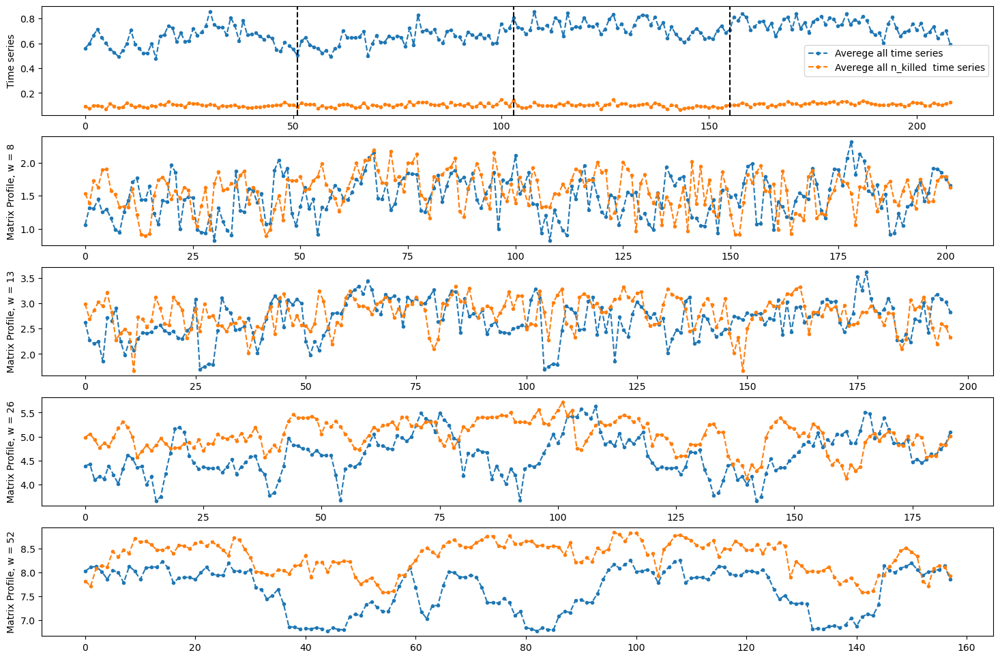

In [131]:
w_list = [8, 13, 26, 52] # length of subsequence to compare: two month, quarter, half year, year

fig, ax = plt.subplots(5, 1, figsize=(18, 12))
ax[0].plot(incidents_by_city_df.mean().values, '.--', label='Averege all time series')
ax[0].plot(incidents_killed_by_city_df.mean().values, '.--', label='Averege all n_killed  time series')
ax[0].set_ylabel('Time series', size=10)
ax[0].axvline(x=n_weeks_per_year-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*2-1, color='k', linestyle='--')
ax[0].axvline(x=n_weeks_per_year*3-1, color='k', linestyle='--')
ax[0].legend()

for i, window in enumerate(w_list):
    mp, mpi = matrixProfile.stomp(incidents_by_city_df.mean().values, window)
    ax[i+1].plot(mp, '.--')
    mp, mpi = matrixProfile.stomp(incidents_killed_by_city_df.mean().values, window)
    ax[i+1].plot(mp, '.--')
    ax[i+1].set_ylabel('Matrix Profile, w = ' + str(window), size=10)

Following the approach descrive by Ermshaus et al. in [Window Size Selection In Unsupervised
Time Series Analytics: A Review and Benchmark](https://project.inria.fr/aaltd22/files/2022/08/AALTD22_paper_3876.pdf) we find optimal window size using the Highest Autocorrelation methon from claspy library

Display the optimale window size for New York, Los Angeles, Chicago and mean of all time series:

In [132]:
print('Optimal window size for New York time series: ', highest_autocorrelation(new_york_ts))
print('Optimal window size for Los Angeles time series: ', highest_autocorrelation(los_angeles_ts))
print('Optimal window size for Chicago time series: ', highest_autocorrelation(chicago_ts))

Optimal window size for New York time series:  27
Optimal window size for Los Angeles time series:  81
Optimal window size for Chicago time series:  11


In [133]:
print('Optimal window size for mean of all the time series: ', highest_autocorrelation(incidents_by_city_df.mean().values))

Optimal window size for mean of all the time series:  42


Compute optimal window size for the whole dataset:

In [134]:
optimal_window_size_list = []
for ts in incidents_by_city_df.values:
    optimal_window_size_list.append(highest_autocorrelation(ts))

Visualize the distribution of optimal window sizes:

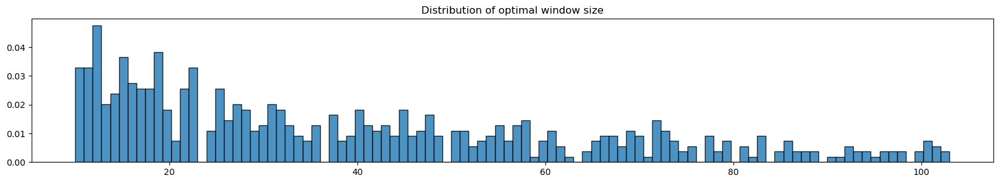

In [135]:
plt.figure(figsize=(20, 3))
plt.hist(optimal_window_size_list, bins=100, density=True, alpha=0.8, edgecolor='k')
plt.title('Distribution of optimal window size');

In [136]:
print('Mean of optimal window size: ', np.mean(optimal_window_size_list))
print('Median of optimal window size: ', np.median(optimal_window_size_list))
print('Standard deviation of optimal window size: ', np.std(optimal_window_size_list))
print('Min of optimal window size: ', np.min(optimal_window_size_list))
print('Max of optimal window size: ', np.max(optimal_window_size_list))

Mean of optimal window size:  39.14795918367347
Median of optimal window size:  32.0
Standard deviation of optimal window size:  24.622459727776043
Min of optimal window size:  10
Max of optimal window size:  103


In [137]:
cluster_df['optimal_window_size'] = optimal_window_size_list

In [702]:
cluster_df[cluster_df['optimal_window_size']==10][['city', 'state', 'cluster_kmeans_features']]

,city,state,cluster_kmeans_features
14,Anderson,SOUTH CAROLINA,1
70,Burlington,IOWA,4
92,Chester,PENNSYLVANIA,5
99,City of Binghamton,NEW YORK,1
182,Fairfield,ALABAMA,1
192,Flint,MICHIGAN,10
227,Hamden,CONNECTICUT,5
239,Henderson,NEVADA,1
241,Hickory,NORTH CAROLINA,1
317,Lincoln,NEBRASKA,3


In [703]:
cluster_df[cluster_df['optimal_window_size']==103][['city', 'state', 'cluster_kmeans_features']]

,city,state,cluster_kmeans_features
461,Rocky Mount,NORTH CAROLINA,5
508,Springdale,ARKANSAS,4


Visualize matrix profile with optimal window for some time series:

In [138]:
def matrix_profile_plot(ts, window, city):
    mp, mpi = matrixProfile.stomp(ts, window)
    plt.figure(figsize=(20, 3))
    plt.plot(ts, '.--', label='Time series')
    plt.plot(mp, '.--', label='Matrix Profile')
    plt.title(f'Matrix Profile, w = {str(window)}, {city}')
    plt.ylabel('Matrix Profile')
    plt.legend()
    plt.tight_layout();

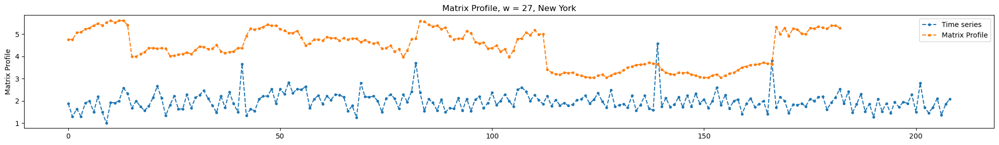

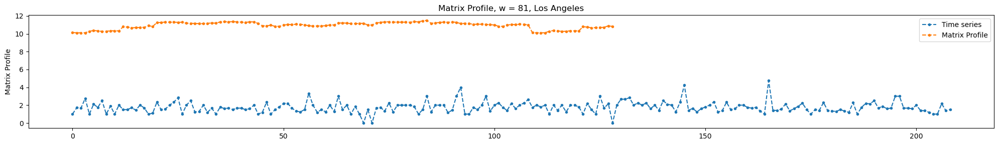

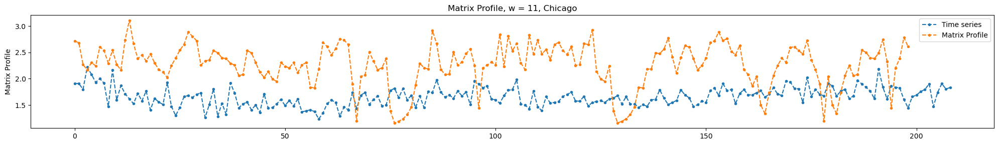

In [139]:
matrix_profile_plot(new_york_ts, window=highest_autocorrelation(new_york_ts), city='New York')
matrix_profile_plot(los_angeles_ts, window=highest_autocorrelation(los_angeles_ts), city='Los Angeles')
matrix_profile_plot(chicago_ts, window=highest_autocorrelation(chicago_ts), city='Chicago')

##  Motifs extraction

Motifs: *"a set of frequently appearing and similar subsequence"*

Our aim is to finding motif sets calculate anomalies as out of distribution values of the matrix profile.

Parameters
- max_motifs: stop finding new motifs once we have max_motifs
- radius: For each motif found, find neighbors that are within radius*motif_mp of the first.
- n_neighbors: number of neighbors from the first to find. If it is None, find all.
- ex_zone: minimum distance between indices for after each subsequence is identified. Defaults to m/2 where m is the subsequence length. If ex_zone = 0, only the found index is exclude, if ex_zone = 1 then if idx is found as a motif idx-1, idx, idx+1 are excluded.


The function returns a tuple (top_motifs, distances) which are lists of the same length.

- top_motifs: This is a list of the indices found for each motif. The first index is the nth motif followed by all nearest neighbors found sorted by distances.
- distances: Minimum Matrix profile value for each motif set.

#### Chicago time serie

In [754]:
window = highest_autocorrelation(chicago_ts)
mp, mpi = matrixProfile.stomp(chicago_ts, window)

In [755]:
motifs_idx, distance  = motifs.motifs(chicago_ts, (mp, mpi), max_motifs=5)

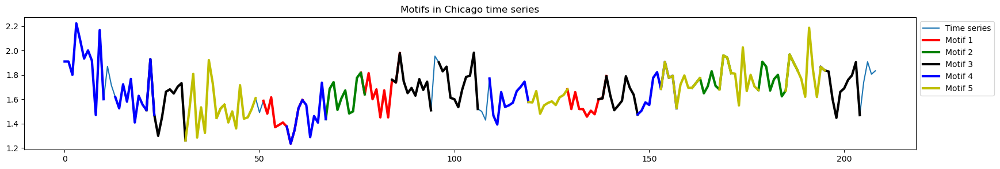

In [761]:
plt.figure(figsize=(20, 3))
plt.plot(chicago_ts, label='Time series')
colors = ['r', 'g', 'k', 'b', 'y'][:len(motifs_idx)]
n = 1
for idx, dist, color in zip(motifs_idx, distance, colors):
    label = True
    for i in idx:
        m_shape = chicago_ts[i:i+window]
        if label:
            plt.plot(range(i,i+window), m_shape, color=color, lw=3, label=f'Motif {n}')
        else:
            plt.plot(range(i,i+window), m_shape, color=color, lw=3)
        label = False
    n += 1
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Motifs in Chicago time series');

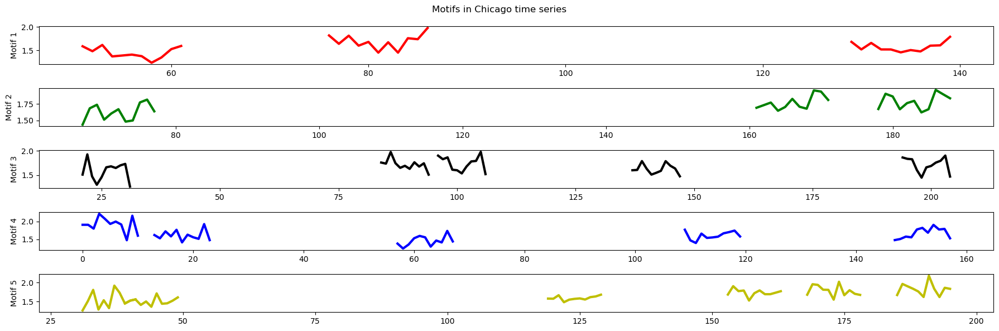

In [250]:
fig, ax = plt.subplots(len(motifs_idx), 1, figsize=(18, 6))
for j, (idx, dist, color) in enumerate(zip(motifs_idx, distance, colors)):
    for i in idx:
        m_shape = chicago_ts[i:i+window]
        ax[j].plot(range(i,i+window), m_shape, color=color, lw=3)
        ax[j].set_ylabel('Motif ' + str(j+1), size=10)
plt.suptitle('Motifs in Chicago time series')
plt.tight_layout();

#### San bernardino time serie

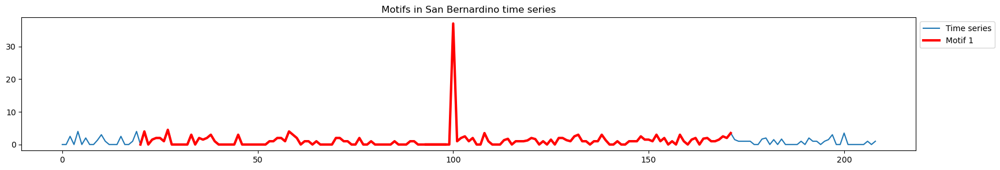

In [773]:
san_bernardino_ts = incidents_by_city_df[(incidents_by_city_df.index == ('San Bernardino', 'CALIFORNIA'))].values[0]
window = highest_autocorrelation(san_bernardino_ts)
mp, mpi = matrixProfile.stomp(san_bernardino_ts, window)
motifs_idx, distance  = motifs.motifs(san_bernardino_ts, (mp, mpi), max_motifs=5)

plt.figure(figsize=(20, 3))
plt.plot(san_bernardino_ts)
colors = ['r', 'g', 'k', 'b', 'y'][:len(motifs_idx)]
for idx, dist, color in zip(motifs_idx, distance, colors):
    for i in idx:
        m_shape = san_bernardino_ts[i:i+window]
        plt.plot(range(i,i+window), m_shape, color=color, lw=3)
plt.legend(['Time series', 'Motif 1'], loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Motifs in San Bernardino time series');

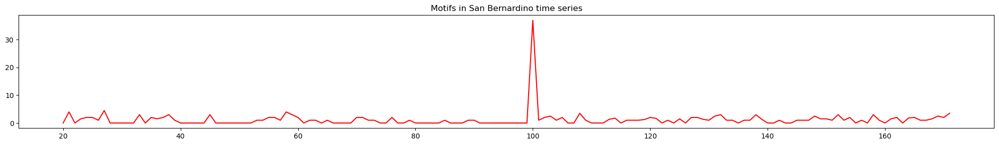

In [774]:
plt.figure(figsize=(20, 3))
for idx, dist, color in zip(motifs_idx, distance, colors):
    for i in idx:
        m_shape = san_bernardino_ts[i:i+window]
        plt.plot(range(i,i+window), m_shape, color=color)
plt.title('Motifs in San Bernardino time series')
plt.tight_layout();

In [712]:
# print week of the year for each motif
print('Motifs in San Bernardino time series, window size = ', window, 'weeks')
san_bernardino_motifs_df = pd.DataFrame(columns=['motif number', 'week start', 'week end', 'date start', 'date end'])
n = 1
for idx, dist in zip(motifs_idx, distance):
    for i in idx:
        date_start = week_to_date(int(i))
        end_date = week_to_date(int(i+window)) + 6*datetime.timedelta(days=1)
        san_bernardino_motifs_df = pd.concat([san_bernardino_motifs_df, pd.DataFrame([[n, i, i+window, date_start, end_date]], 
            columns=['motif number', 'week start', 'week end', 'date start', 'date end'])])
    n += 1
san_bernardino_motifs_df

Motifs in San Bernardino time series, window size =  79 weeks


,motif number,week start,week end,date start,date end
0,1,20,99,2014-05-19,2015-11-29
0,1,93,172,2015-10-12,2017-04-23


In [789]:
start_week_incident = 27
week_end_incident = 27
date_start = week_to_date(start_week_incident)
end_date = week_to_date(week_end_incident) + 6*datetime.timedelta(days=1)
incidents_df[(incidents_df['city'] == 'San Bernardino') & (incidents_df['state'] == 'CALIFORNIA') & 
    (incidents_df['date'] >= date_start) & (incidents_df['date'] <= end_date)][['date', 'n_participants', 'n_killed',
    'n_injured', 'n_arrested', 'n_unharmed', 'avg_age_participants', 'incident_characteristics1', 'incident_characteristics2']]

,date,n_participants,n_killed,n_injured,n_arrested,n_unharmed,avg_age_participants,incident_characteristics1,incident_characteristics2
144022,2014-07-08,2.0,1.0,1.0,0.0,0.0,32.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
149181,2014-07-07,7.0,1.0,4.0,0.0,2.0,24.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"


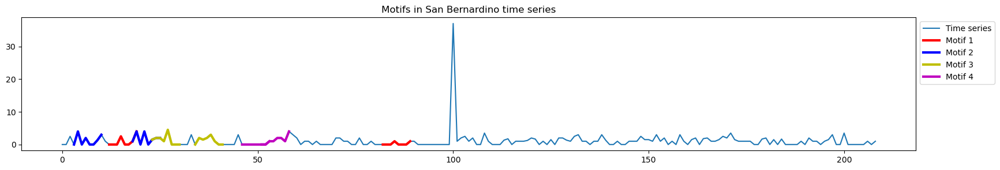

In [799]:
san_bernardino_ts = incidents_by_city_df[(incidents_by_city_df.index == ('San Bernardino', 'CALIFORNIA'))].values[0]
window = 8
mp, mpi = matrixProfile.stomp(san_bernardino_ts, window)
motifs_idx, distance  = motifs.motifs(san_bernardino_ts, (mp, mpi), max_motifs=5)

plt.figure(figsize=(20, 3))
plt.plot(san_bernardino_ts, label='Time series')
colors = ['r', 'b', 'y', 'm', 'g'][:len(motifs_idx)]
n = 1
for idx, dist, color in zip(motifs_idx, distance, colors):
    label = True
    for i in idx:
        m_shape = san_bernardino_ts[i:i+window]
        if label:
            plt.plot(range(i,i+window), m_shape, color=color, lw=3, label=f'Motif {n}')
        else:
            plt.plot(range(i,i+window), m_shape, color=color, lw=3)
        label = False
    n += 1
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Motifs in San Bernardino time series');

#### Motifs extraction for clusters

Motifs extraction for mean time series in the same cluster:

In [145]:
# plot in the same figure motifs for mean time series in the same cluster
def plot_motifs_per_cluster(time_series, cluster, window):
    plt.figure(figsize=(20, 3))
    ts = np.mean(time_series, axis=0)
    window = highest_autocorrelation(ts)
    mp, mpi = matrixProfile.stomp(ts, window)
    motifs_idx, distance  = motifs.motifs(ts, (mp, mpi), max_motifs=5)
    plt.plot(ts)
    colors = ['r', 'g', 'k', 'b', 'y'][:len(motifs_idx)]
    for idx, dist, color in zip(motifs_idx, distance, colors):
        for i in idx:
            m_shape = ts[i:i+window]
            plt.plot(range(i,i+window), m_shape, color=color)
    plt.title('Motifs in cluster '+str(cluster));

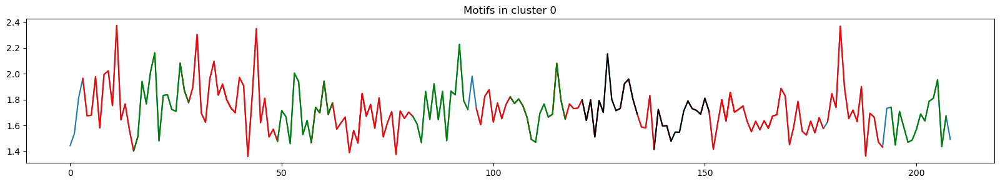

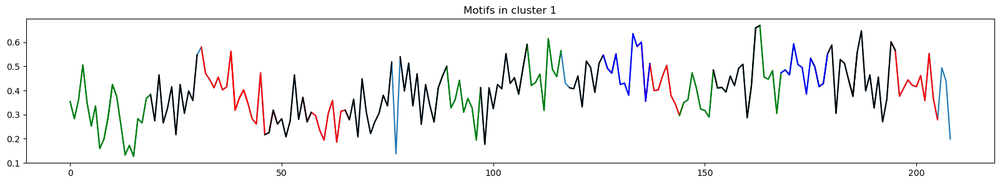

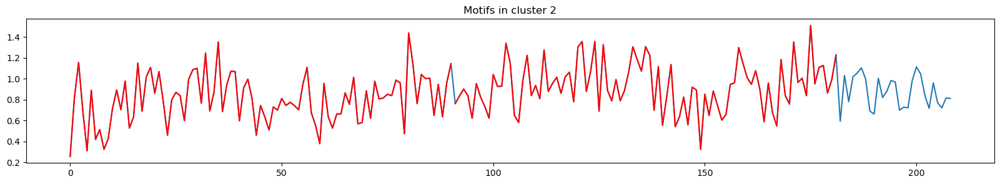

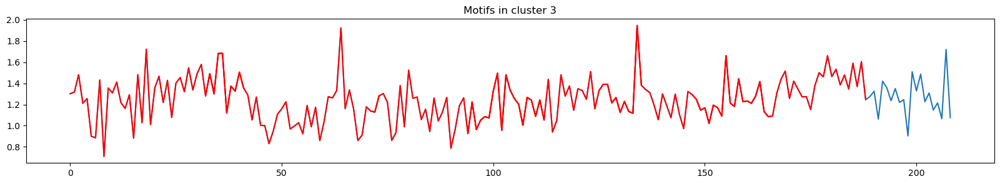

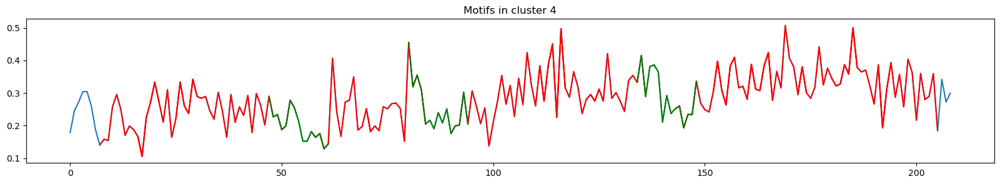

...

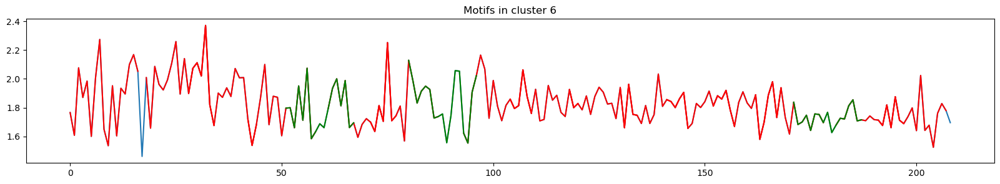

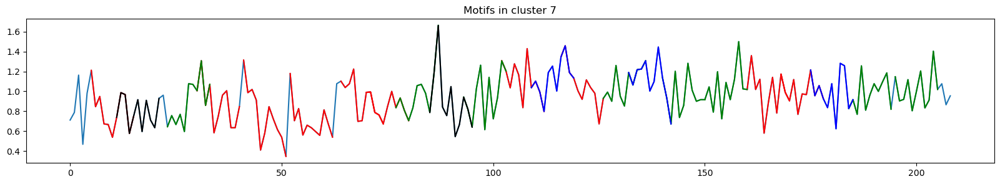

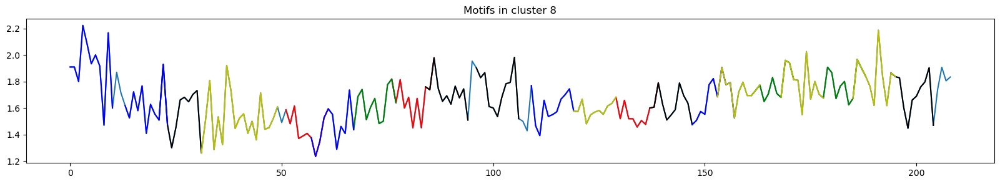

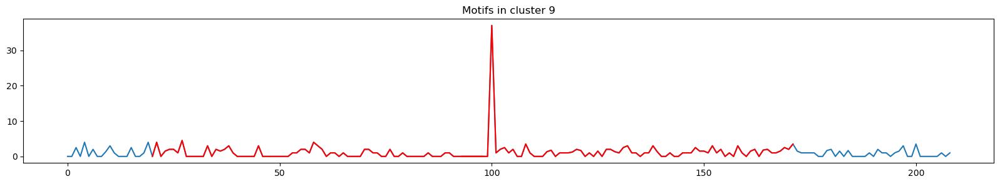

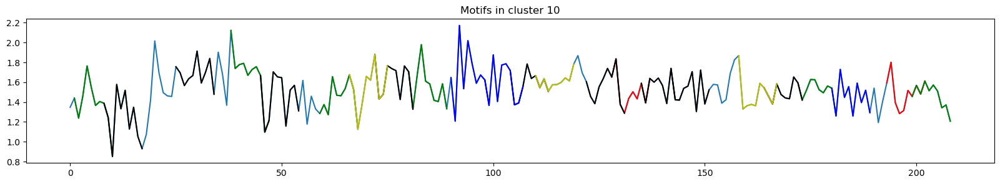

In [146]:
for cluster in range(best_k):
    time_series = incidents_by_city_df[cluster_df['cluster_kmeans_features'].values==cluster].values
    plot_motifs_per_cluster(time_series, cluster, window)

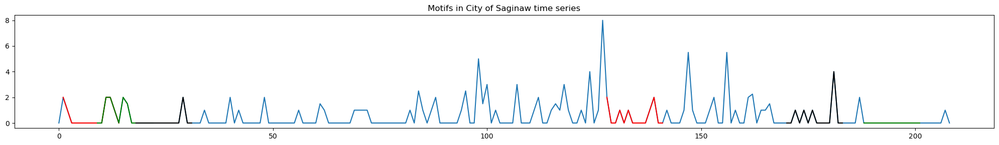

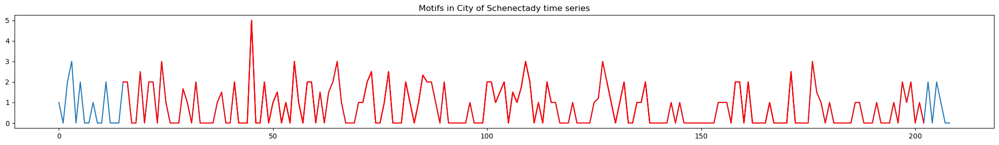

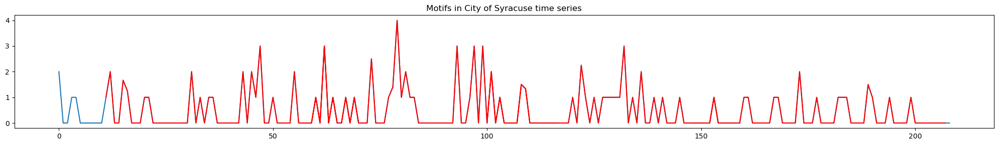

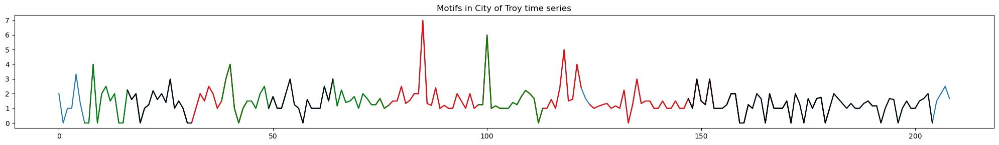

In [1055]:
for ts, w, city in zip(incidents_by_city_df.values[104:108], 
        optimal_window_size_list[108:113], 
        cities_df.index.get_level_values('city').to_list()[108:113]):
    mp, mpi = matrixProfile.stomp(ts, w)
    motifs_idx, distance  = motifs.motifs(ts, (mp, mpi), max_motifs=5)
    plt.figure(figsize=(20, 3))
    plt.plot(ts)
    colors = ['r', 'g', 'k', 'b', 'y'][:len(motifs_idx)]
    for idx, dist, color in zip(motifs_idx, distance, colors):
        for i in idx:
            m_shape = ts[i:i+w]
            plt.plot(range(i,i+w), m_shape, color=color)
    plt.title(f'Motifs in {city} time series')
    plt.tight_layout();

## Anomalies extraction

Parameters  
- mp: matrix profile numpy array
- k: the number of discords to discover
- ex_zone: the number of samples to exclude and set to Inf on either side of a found discord   


Returns a list of indexes represent the discord starting locations. MaxInt indicates there were no more discords that could be found due to too many exclusions or profile being too small. Discord start indices are sorted by highest matrix profile value.

In [829]:
window = highest_autocorrelation(chicago_ts)
mp, mpi = matrixProfile.stomp(chicago_ts, window)
anoms = discords(mp, ex_zone=10, k=10)

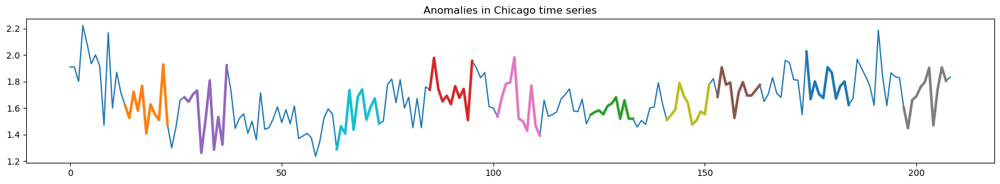

In [846]:
plt.figure(figsize=(20, 3))
plt.plot(chicago_ts)
for a in anoms:
    a_shape = chicago_ts[a:a+window]
    plt.plot(range(a, a+window), a_shape, lw=3)
plt.title('Anomalies in Chicago time series');

In [831]:
# creade df with anomalies statistics
anomalies_df = pd.DataFrame(columns=['', 'average', 'std', 'median', 'min', 'max'])
anomalies_df = anomalies_df.append({
    '': 'Chicago time series anomalies',
    'average': np.mean(chicago_ts[anoms]),
    'std': np.std(chicago_ts[anoms]),
    'median': np.median(chicago_ts[anoms]),
    'min': np.min(chicago_ts[anoms]),
    'max': np.max(chicago_ts[anoms])}, ignore_index=True)
anomalies_df = anomalies_df.append({
    '': 'Chicago time series',
    'average': np.mean(chicago_ts),
    'std': np.std(chicago_ts),
    'median': np.median(chicago_ts),
    'min': np.min(chicago_ts),
    'max': np.max(chicago_ts)}, ignore_index=True)

C:\Users\giuli\AppData\Local\Temp\ipykernel_15072\4237407429.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\giuli\AppData\Local\Temp\ipykernel_15072\4237407429.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [842]:
for anomaly in anoms:
    print('From week', anomaly, 'to', anomaly+window) #,'\nvalues: ', chicago_ts[anomaly:anomaly+window])
    date_start = week_to_date(int(anomaly))
    end_date = week_to_date(int(anomaly+window)) + 6*datetime.timedelta(days=1)
    print('Number of incidents: ', incidents_df[(incidents_df['city'] == 'Chicago') & (incidents_df['state'] == 'ILLINOIS') & 
        (incidents_df['date'] >= date_start) & (incidents_df['date'] <= end_date)].shape[0])
anomalies_df

From week 13 to 24
Number of incidents:  482
From week 123 to 134
Number of incidents:  885
From week 85 to 96
Number of incidents:  587
From week 27 to 38
Number of incidents:  514
From week 153 to 164
Number of incidents:  608
From week 101 to 112
Number of incidents:  566
From week 197 to 208
Number of incidents:  516
From week 141 to 152
Number of incidents:  743
From week 63 to 74
Number of incidents:  583
From week 174 to 185
Number of incidents:  851


,,average,std,median,min,max
0,Chicago time series anomalies,1.623218,0.178863,1.610907,1.288889,2.025000
1,Chicago time series,1.659077,0.178454,1.660000,1.235294,2.222222


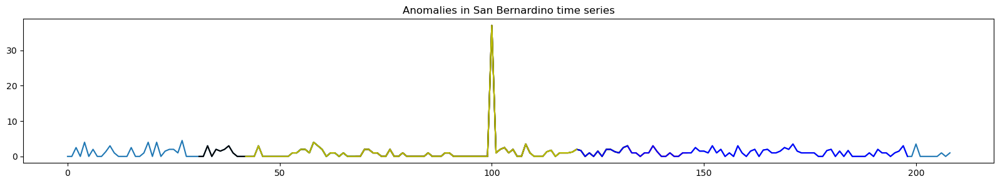

In [849]:
window = highest_autocorrelation(san_bernardino_ts)
mp, mpi = matrixProfile.stomp(san_bernardino_ts, window)
anoms = discords(mp, ex_zone=10, k=10)

plt.figure(figsize=(20, 3))
plt.plot(san_bernardino_ts)
colors = ['r', 'g', 'k', 'b', 'y'][:len(motifs_idx)]
window = highest_autocorrelation(san_bernardino_ts)
for a, color in zip(anoms, colors):
    a_shape = san_bernardino_ts[a:a+window]
    plt.plot(range(a, a+window), a_shape, color=color)
plt.title('Anomalies in San Bernardino time series');

In [850]:
sb_anomalies_df = pd.DataFrame(columns=['', 'average', 'std', 'median', 'min', 'max'])
sb_anomalies_df = sb_anomalies_df.append({
    '': 'San Bernardino time series anomalies',
    'average': np.mean(san_bernardino_ts[anoms]),
    'std': np.std(san_bernardino_ts[anoms]),
    'median': np.median(san_bernardino_ts[anoms]),
    'min': np.min(san_bernardino_ts[anoms]),
    'max': np.max(san_bernardino_ts[anoms])}, ignore_index=True)
sb_anomalies_df = sb_anomalies_df.append({
    '': 'San Bernardino time series',
    'average': np.mean(san_bernardino_ts),
    'std': np.std(san_bernardino_ts),
    'median': np.median(san_bernardino_ts),
    'min': np.min(san_bernardino_ts),
    'max': np.max(san_bernardino_ts)}, ignore_index=True)

C:\Users\giuli\AppData\Local\Temp\ipykernel_15072\1383693574.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\giuli\AppData\Local\Temp\ipykernel_15072\1383693574.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [848]:
for anomaly in anoms:
    print('week: ', anomaly+window, '\t value: ', san_bernardino_ts[anomaly])
sb_anomalies_df

week:  24 	 value:  0.0
week:  134 	 value:  1.0
week:  96 	 value:  1.0
week:  38 	 value:  4.5
week:  164 	 value:  1.0
week:  112 	 value:  1.0
week:  208 	 value:  3.0
week:  152 	 value:  0.0
week:  74 	 value:  1.0
week:  185 	 value:  1.0


,,average,std,median,min,max
0,San Bernardino time series anomalies,1.35000,1.304799,1.0,0.0,4.5
1,San Bernardino time series,1.12504,2.709875,1.0,0.0,37.0


In [714]:
print('Cardinality zero values for San Bernardino time serie: ', np.count_nonzero(san_bernardino_ts == 0))

Cardinality zero values for San Bernardino time serie:  94


In [713]:
san_bernardino_motifs_df

,motif number,week start,week end,date start,date end
0,1,20,99,2014-05-19,2015-11-29
0,1,93,172,2015-10-12,2017-04-23


## Shaplet discovery

Create binary var is_killed:

In [169]:
cities_df['fatal_incidents_ratio'].describe()

count    588.000000
mean       0.244454
std        0.139845
min        0.014706
25%        0.140802
50%        0.222222
75%        0.318758
max        0.840909
Name: fatal_incidents_ratio, dtype: float64

We define the binary variable is_killed for each city time series.

A time series related to a city is labeled as True if the ratio of fatal incidents in the city between 2014 and 2017 is above the second quantile of the distribuition of fatal_incidents_ratio related to all time series; otherwise, it is labeled as False.

In [170]:
is_killed = cities_df['fatal_incidents_ratio'].apply(lambda x: 1 if x > np.quantile(cities_df['fatal_incidents_ratio'], 0.5) else 0)

In [171]:
print('Number of cities with n_killed over second quantile: ', np.sum(is_killed))
print('Number of cities with n_killed in first or second quantile: ', len(is_killed) - np.sum(is_killed))

Number of cities with n_killed over second quantile:  293
Number of cities with n_killed in first or second quantile:  295


Split train and test set:

In [912]:
X = incidents_by_city_df.values
y_sh = cluster_df['cluster_kmeans_features'].values
y_sh[y_sh==9] = 4
y_sh[y_sh==8] = 6
y = is_killed

In [913]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, stratify=y_sh, random_state=42)

#### ShapeletModel Classifier

In [914]:
n_ts, ts_sz = X_train.shape[0], X_train.shape[1]
n_classes = len(set(y))

shapelet_sizes = grabocka_params_to_shapelet_size_dict(n_ts=n_ts, ts_sz=ts_sz,
    n_classes=n_classes, l=0.1, r=1)
print('n_ts', n_ts)
print('ts_sz', ts_sz)
print('n_classes', n_classes)
print('shapelet_sizes', shapelet_sizes)

n_ts 470
ts_sz 209
n_classes 2
shapelet_sizes {20: 4}


Performe grid search to find best model:

In [915]:
param_grid = {
    'optimizer': ['sgd'],
    'scale': [False], # scale time series
    'weight_regularizer': [0.01, 0.1, 0.2],
    'max_iter': [200],
    'batch_size': [16, 32, 64, 128, 256, 512],
    'verbose': [1],
    'random_state': [42]
}

gs = GridSearchCV(
    ShapeletModel(),
    param_grid=param_grid,
    n_jobs=-1,
    scoring=make_scorer(accuracy_score),
    verbose=10,
    cv=3, # uses a stratified 3-fold cv to validate the models
    refit=False
)
gs.fit(X_train, y_train)

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.



Fitting 3 folds for each of 18 candidates, totalling 54 fits


GridSearchCV(cv=3, estimator=LearningShapelets(), n_jobs=-1,
             param_grid={'batch_size': [16, 32, 64, 128, 256, 512],
                         'max_iter': [200], 'optimizer': ['sgd'],
                         'random_state': [42], 'scale': [False], 'verbose': [1],
                         'weight_regularizer': [0.01, 0.1, 0.2]},
             refit=False, scoring=make_scorer(accuracy_score), verbose=10)

In [916]:
cv_results_df = pd.DataFrame(gs.cv_results_)
params = [col for col in cv_results_df.columns if 'param_' in col and 'random' not in col]
cv_results_df.sort_values(
    by='mean_test_score',
    ascending=False)[params+['std_test_score', 'mean_test_score']].head(20).style.background_gradient(
    subset=['std_test_score', 'mean_test_score'], cmap='Blues')

,param_batch_size,param_max_iter,param_optimizer,param_scale,param_verbose,param_weight_regularizer,std_test_score,mean_test_score
0,16,200,sgd,False,1,0.010000,0.014403,0.555338
3,32,200,sgd,False,1,0.010000,0.013310,0.555311
9,128,200,sgd,False,1,0.010000,0.005452,0.542558
6,64,200,sgd,False,1,0.010000,0.012918,0.540449
5,32,200,sgd,False,1,0.200000,0.003900,0.536161
4,32,200,sgd,False,1,0.100000,0.009798,0.534025
8,64,200,sgd,False,1,0.200000,0.002602,0.531915
1,16,200,sgd,False,1,0.100000,0.011829,0.523436
2,16,200,sgd,False,1,0.200000,0.010520,0.523409
13,256,200,sgd,False,1,0.100000,0.008338,0.523395


Train best model and make predictions on test set:

In [924]:
best_model_params = cv_results_df.loc[gs.best_index_]['params']
shp_clf = ShapeletModel(**best_model_params)

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.



In [925]:
shp_clf.fit(X_train, y_train)

Epoch 1/200
30/30 [==============================] - 2s 4ms/step - loss: 0.8206 - binary_accuracy: 0.5170 - binary_crossentropy: 0.7991
Epoch 2/200
30/30 [==============================] - 0s 4ms/step - loss: 0.7855 - binary_accuracy: 0.5043 - binary_crossentropy: 0.7653
Epoch 3/200
30/30 [==============================] - 0s 4ms/step - loss: 0.7668 - binary_accuracy: 0.5000 - binary_crossentropy: 0.7476
Epoch 4/200
30/30 [==============================] - 0s 6ms/step - loss: 0.7520 - binary_accuracy: 0.4830 - binary_crossentropy: 0.7338
Epoch 5/200
30/30 [==============================] - 0s 5ms/step - loss: 0.7405 - binary_accuracy: 0.4872 - binary_crossentropy: 0.7229
Epoch 6/200
30/30 [==============================] - 0s 5ms/step - loss: 0.7316 - binary_accuracy: 0.4851 - binary_crossentropy: 0.7147
Epoch 7/200
30/30 [==============================] - 0s 4ms/step - loss: 0.7252 - binary_accuracy: 0.4872 - binary_crossentropy: 0.7089
Epoch 8/200
30/30 [=============================

LearningShapelets(batch_size=16, max_iter=200, random_state=13, verbose=1,
                  weight_regularizer=0.01)

In [928]:
predicted_labels = shp_clf.predict(X_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels))
predicted_locations = shp_clf.locate(X_train)
print(classification_report(y_test, predicted_labels, digits=3))

8/8 [==============================] - 0s 2ms/step


Correct classification rate: 0.635593220338983
30/30 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

           0      0.786     0.373     0.506        59
           1      0.589     0.898     0.711        59

    accuracy                          0.636       118
   macro avg      0.687     0.636     0.609       118
weighted avg      0.687     0.636     0.609       118



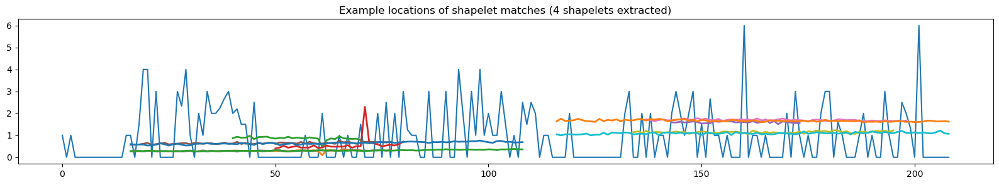

In [971]:
ts_id = 94 # chicago
plt.figure(figsize=(20, 3))
n_shapelets = sum(shapelet_sizes.values())
plt.title(f"Example locations of shapelet matches ({n_shapelets} shapelets extracted)")

plt.plot(X[ts_id].ravel())
for idx_shp, shp in enumerate(shp_clf.shapelets_):
    t0 = predicted_locations[ts_id, idx_shp]
    plt.plot(np.arange(t0, t0 + len(shp)), shp, linewidth=2)

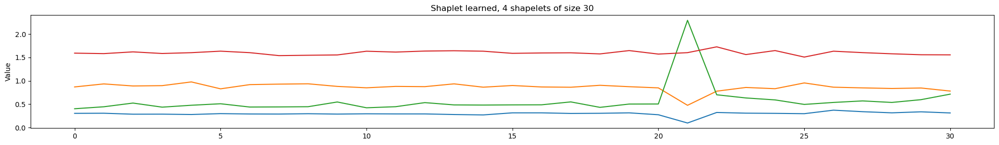

In [996]:
n_shapelet_sizes = len(shapelet_sizes.keys())
max_shapelet_size = max(shapelet_sizes.keys())

plt.figure(figsize=(20, 3))
for i, sz in enumerate(shapelet_sizes.keys()):
    plt.subplot(n_shapelet_sizes, 1, i + 1)
    plt.title("Shaplet learned, %d shapelets of size 30" % (shapelet_sizes[sz]))
    for sh_idx in range(shapelet_sizes[sz]):
        plt.plot(shp_clf.shapelets_as_time_series_[sh_idx + sum(list(shapelet_sizes.values())[:i])].ravel())
        plt.tight_layout()
        plt.ylabel('Value')

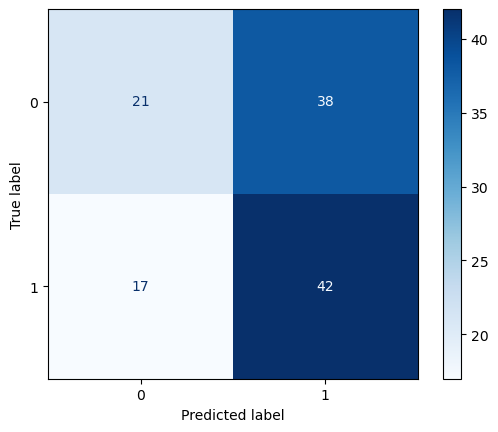

In [ ]:
ConfusionMatrixDisplay(confusion_matrix(y_test, predicted_labels)).plot(cmap=plt.cm.Blues);

### Shaplet Discovery with LearningShapelets

**Shapelet Transform for Time Series**

The Shapelet model consists of a logistic regression layer on top of this transform. The shapelet coefficients as well as logistic regression weights are optimized by gradient descent on a L2-penalized cross-entropy loss.

In [859]:
X = incidents_by_city_df.values
y_sh = cluster_df['cluster_kmeans_features'].values
y_sh[y_sh==9] = 4
y_sh[y_sh==8] = 6
y = is_killed.values

# split data into train and test sets, considering the stratification for classes with 1 data point
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, stratify=y_sh, random_state=42)

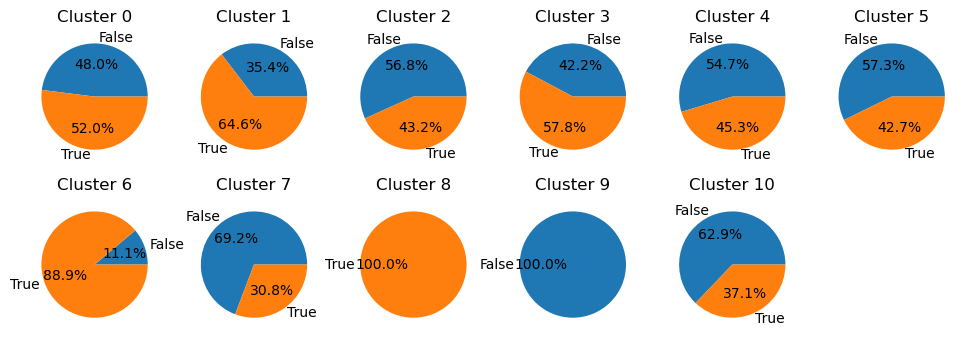

In [970]:
# pie for % y_train true and false values for train set divided by cluster
plt.figure(figsize=(12, 4))
for i in range(best_k):
    plt.subplot(2, 6, i+1)
    if i !=8 and i !=9:
        plt.pie(np.unique(y[cluster_df['cluster_kmeans_features'].values==i], return_counts=True)[1], 
            labels=['False', 'True'], autopct='%1.1f%%');
    else:
        # pie with 1 data point
        labels = y[kmeans.labels_==i]
        lab = [False if labels[0] == 1 else True]
        colors = ['tab:blue', 'tab:orange'] if labels[0] == 1 else ['tab:orange', 'tab:blue']
        plt.pie(np.unique(labels, return_counts=True)[1], labels=lab, autopct='%1.1f%%', colors=colors);
    plt.title('Cluster '+str(i));

In [920]:
print('Number of true values in train set: ', np.sum(y_train), '(%.2f%%)' % (np.sum(y_train)/len(y_train)*100))
print('Number of false values in train set: ', len(y_train) - np.sum(y_train), '(%.2f%%)' % (
    (len(y_train) - np.sum(y_train))/len(y_train)*100))
print('Number of true values in test set: ', np.sum(y_test), '(%.2f%%)' % (np.sum(y_test)/len(y_test)*100))
print('Number of false values in test set: ', len(y_test) - np.sum(y_test), '(%.2f%%)' % (
    (len(y_test) - np.sum(y_test))/len(y_test)*100))

Number of true values in train set:  234 (49.79%)
Number of false values in train set:  236 (50.21%)
Number of true values in test set:  59 (50.00%)
Number of false values in test set:  59 (50.00%)


In [860]:
n_ts, ts_sz = X_train.shape[0], X_train.shape[1]
n_classes = len(set(y))

shapelet_sizes = grabocka_params_to_shapelet_size_dict(n_ts=n_ts, ts_sz=ts_sz, n_classes=n_classes, l=0.15, r=2)
print('n_ts', n_ts)
print('ts_sz', ts_sz)
print('n_classes', n_classes)
print('shapelet_sizes', shapelet_sizes)

n_ts 470
ts_sz 209
n_classes 2
shapelet_sizes {31: 4, 62: 4}


In [861]:
learn_sh_clf = LearningShapelets(n_shapelets_per_size=shapelet_sizes, max_iter=3000, batch_size=64, verbose=0, 
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), weight_regularizer=0.001, shapelet_length=0.1, 
    total_lengths=24, random_state=42)

c:\Users\giuli\anaconda3\lib\site-packages\tslearn\shapelets\shapelets.py:354: FutureWarning:

The default value for 'scale' is set to False in version 0.4 to ensure backward compatibility, but is likely to change in a future version.



In [863]:
learn_sh_clf.fit(X_train, y_train)

X_sh_train = learn_sh_clf.transform(X_train)
X_sh_test = learn_sh_clf.transform(X_test)

In [864]:
predicted_labels_shap = learn_sh_clf.predict(X_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels_shap))

Correct classification rate: 0.5084745762711864


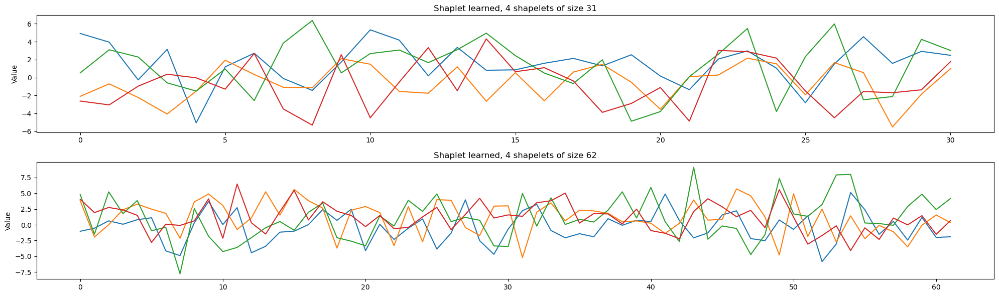

In [865]:
# Show the shapelets that are as many as we calculated in the dictionary
n_shapelet_sizes = len(shapelet_sizes.keys())
max_shapelet_size = max(shapelet_sizes.keys())

plt.figure(figsize=(20, 6))
for i, sz in enumerate(shapelet_sizes.keys()):
    plt.subplot(n_shapelet_sizes, 1, i + 1)
    plt.title("Shaplet learned, %d shapelets of size %d" % (shapelet_sizes[sz], sz))
    for sh_idx in range(shapelet_sizes[sz]):
        plt.plot(learn_sh_clf.shapelets_as_time_series_[sh_idx + sum(list(shapelet_sizes.values())[:i])].ravel())
        plt.tight_layout()
        plt.ylabel('Value')

### DecisionTreeClassifier on shapelet

In [866]:
param_grid = {
    # values to try
    'criterion': ['entropy', 'gini'],
    'class_weight': ['balanced', None],
    'min_samples_split': [2, 0.01, 0.02, 0.025, 0.05, 0.1],
    'min_samples_leaf': [1, 0.01, 0.02, 0.025, 0.05, 0.075, 0.1],
    'splitter': ['best', 'random'],
    #'max_depth': [None],
    #'max_leaf_nodes': [None],
    #'min_impurity_decrease': [0],
    'ccp_alpha': [0, 0.001, 0.01, 0.1, 0.2, 0.5],
    #'min_weight_fraction_leaf': [0],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'random_state': [42]
}

gs = GridSearchCV(
    DecisionTreeClassifier(),
    param_grid=param_grid,
    n_jobs=-1,
    scoring=make_scorer(f1_score),
    verbose=10,
    cv=5, # uses a stratified 5-fold cv to validate the models
    refit=False
)
gs.fit(X_sh_train, y_train)

Fitting 5 folds for each of 8064 candidates, totalling 40320 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'ccp_alpha': [0, 0.001, 0.01, 0.1, 0.2, 0.5],
                         'class_weight': ['balanced', None],
                         'criterion': ['entropy', 'gini'],
                         'max_features': ['auto', 'sqrt', 'log2', None],
                         'min_samples_leaf': [1, 0.01, 0.02, 0.025, 0.05, 0.075,
                                              0.1],
                         'min_samples_split': [2, 0.01, 0.02, 0.025, 0.05, 0.1],
                         'random_state': [42], 'splitter': ['best', 'random']},
             refit=False, scoring=make_scorer(f1_score), verbose=10)

In [867]:
cv_results_df = pd.DataFrame(gs.cv_results_)
params = [col for col in cv_results_df.columns if 'param_' in col and 'random' not in col]
cv_results_df.sort_values(
    by='mean_test_score',
    ascending=False)[params+['std_test_score', 'mean_test_score']].head(10).style.background_gradient(
    subset=['std_test_score', 'mean_test_score'], cmap='Blues')

,param_ccp_alpha,param_class_weight,param_criterion,param_max_features,param_min_samples_leaf,param_min_samples_split,param_splitter,std_test_score,mean_test_score
844,0,None,entropy,log2,1,0.020000,best,0.071884,0.820501
2188,0.001000,None,entropy,log2,1,0.020000,best,0.071884,0.820501
3532,0.010000,None,entropy,log2,1,0.020000,best,0.049368,0.817645
3616,0.010000,None,entropy,None,1,0.020000,best,0.018097,0.812952
2186,0.001000,None,entropy,log2,1,0.010000,best,0.029062,0.812657
842,0,None,entropy,log2,1,0.010000,best,0.029062,0.812657
3612,0.010000,None,entropy,None,1,2,best,0.032325,0.810412
2272,0.001000,None,entropy,None,1,0.020000,best,0.016903,0.809339
928,0,None,entropy,None,1,0.020000,best,0.016903,0.809339
2864,0.010000,balanced,entropy,log2,1,0.050000,best,0.021421,0.809138


In [889]:
best_index = gs.best_index_
best_model_params = cv_results_df.loc[best_index]['params']
dt = DecisionTreeClassifier(**best_model_params)

In [890]:
dt.fit(X_sh_train, y_train)

DecisionTreeClassifier(ccp_alpha=0, criterion='entropy', max_features='log2',
                       min_samples_split=0.02, random_state=156)

In [948]:
predicted_labels_dt = dt.predict(X_sh_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels_dt))

print(classification_report(y_test, predicted_labels_dt, digits=3))

Correct classification rate: 0.6101694915254238
              precision    recall  f1-score   support

           0      0.607     0.627     0.617        59
           1      0.614     0.593     0.603        59

    accuracy                          0.610       118
   macro avg      0.610     0.610     0.610       118
weighted avg      0.610     0.610     0.610       118



In [892]:
# complementarity of the two models
print('Complementarity of the two models:', accuracy_score(predicted_labels_shap, predicted_labels_dt))

complementary_predicted_labels_dt = [1 if x==0 else 0 for x in predicted_labels_dt]
print('Correct classification rate:', accuracy_score(y_test, complementary_predicted_labels_dt))

Complementarity of the two models: 0.6779661016949152
Correct classification rate: 0.3898305084745763


In [1012]:
# print shaplet number and dimension
shaplet_number = 1
shapelet_sizes = learn_sh_clf.n_shapelets_per_size
for i, sz in enumerate(shapelet_sizes.keys()):
    for sh_idx in range(shapelet_sizes[sz]):
        print('Shaplet number: ', shaplet_number, 'Dimension: ', sz)
        shaplet_number += 1

Shaplet number:  1 Dimension:  31
Shaplet number:  2 Dimension:  31
Shaplet number:  3 Dimension:  31
Shaplet number:  4 Dimension:  31
Shaplet number:  5 Dimension:  62
Shaplet number:  6 Dimension:  62
Shaplet number:  7 Dimension:  62
Shaplet number:  8 Dimension:  62


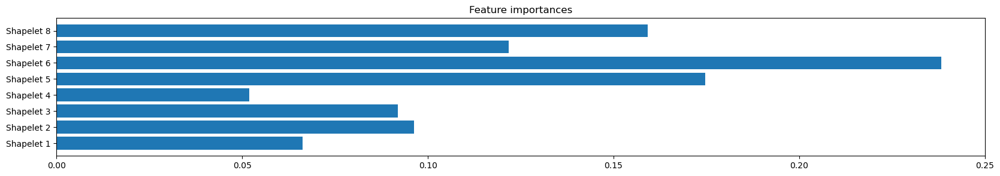

In [1004]:
plt.figure(figsize=(20, 3))
plt.barh(y=range(len(dt.feature_importances_)), width=dt.feature_importances_)
plt.yticks(range(len(dt.feature_importances_)), ['Shapelet '+str(i+1) for i in range(len(dt.feature_importances_))])
plt.title('Feature importances');

### KNeighborsClassifier on shapelet

In [893]:
knn = KNeighborsClassifier()
pipe = Pipeline(steps=[('knn', knn)])
param_grid = [
    {
        'knn__n_neighbors': [3, 5, 7, 9, 11, 13, 21, 31, 51, 73, 77, 79, 103],
        'knn__weights': ['uniform', 'distance'],
        'knn__algorithm': ['brute', 'kd_tree', 'ball_tree'],
        'knn__metric': ['minkowski', 'euclidean', 'manhattan', 'chebyshev'],
        'knn__p': [1, 2, 3, 4, 5, 6, 7, 8, 9]
    }
]

gs = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    n_jobs=-1,
    scoring=make_scorer(f1_score),
    verbose=10,
    cv=5,
    refit=False
)
gs.fit(X_sh_train, y_train)

Fitting 5 folds for each of 2808 candidates, totalling 14040 fits


GridSearchCV(cv=5, estimator=Pipeline(steps=[('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid=[{'knn__algorithm': ['brute', 'kd_tree', 'ball_tree'],
                          'knn__metric': ['minkowski', 'euclidean', 'manhattan',
                                          'chebyshev'],
                          'knn__n_neighbors': [3, 5, 7, 9, 11, 13, 21, 31, 51,
                                               73, 77, 79, 103],
                          'knn__p': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                          'knn__weights': ['uniform', 'distance']}],
             refit=False, scoring=make_scorer(f1_score), verbose=10)

In [894]:
cv_results_df = pd.DataFrame(gs.cv_results_)
params = [col for col in cv_results_df.columns if 'param_' in col and 'random' not in col]
cv_results_df.sort_values(
    by='mean_test_score',
    ascending=False)[params+['std_test_score', 'mean_test_score']].head(10).style.background_gradient(
    subset=['std_test_score', 'mean_test_score'], cmap='Blues')

,param_knn__algorithm,param_knn__metric,param_knn__n_neighbors,param_knn__p,param_knn__weights,std_test_score,mean_test_score
1893,ball_tree,minkowski,5,2,distance,0.019673,0.952817
265,brute,euclidean,5,7,distance,0.019673,0.952817
1205,kd_tree,euclidean,5,9,distance,0.019673,0.952817
21,brute,minkowski,5,2,distance,0.019673,0.952817
263,brute,euclidean,5,6,distance,0.019673,0.952817
2125,ball_tree,euclidean,5,1,distance,0.019673,0.952817
2141,ball_tree,euclidean,5,9,distance,0.019673,0.952817
2127,ball_tree,euclidean,5,2,distance,0.019673,0.952817
2129,ball_tree,euclidean,5,3,distance,0.019673,0.952817
261,brute,euclidean,5,5,distance,0.019673,0.952817


In [895]:
best_index = gs.best_index_
best_model_params = cv_results_df.loc[best_index]['params']
best_model_params = {k.replace('knn__', ''): v for k, v in best_model_params.items()}
knn = KNeighborsClassifier(**best_model_params)

In [899]:
knn.fit(X_sh_train, y_train)

KNeighborsClassifier(algorithm='brute', weights='distance')

In [951]:
predicted_labels_knn = knn.predict(X_sh_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels_knn))

print(classification_report(y_test, predicted_labels_knn, digits=3))

Correct classification rate: 0.576271186440678
              precision    recall  f1-score   support

           0      0.582     0.542     0.561        59
           1      0.571     0.610     0.590        59

    accuracy                          0.576       118
   macro avg      0.577     0.576     0.576       118
weighted avg      0.577     0.576     0.576       118



### Rocket Classifier on time series

[ROCKET: Exceptionally fast and accurate time series classification using random convolutional kernels](https://arxiv.org/pdf/1910.13051.pdf), Dempster et al.

In [1015]:
rocket = RocketClassifier(num_kernels=500, rocket_transform='minirocket', random_state=42)

In [1016]:
rocket.fit(X_train, y_train)

RocketClassifier(num_kernels=500, random_state=42,
                 rocket_transform='minirocket')

In [1017]:
predicted_labels_rocket = rocket.predict(X_test)
print("Correct classification rate:", accuracy_score(y_test, predicted_labels_rocket))

Correct classification rate: 0.559322033898305


In [1018]:
print(classification_report(y_test, predicted_labels_rocket, digits=3))

              precision    recall  f1-score   support

           0      0.564     0.525     0.544        59
           1      0.556     0.593     0.574        59

    accuracy                          0.559       118
   macro avg      0.560     0.559     0.559       118
weighted avg      0.560     0.559     0.559       118



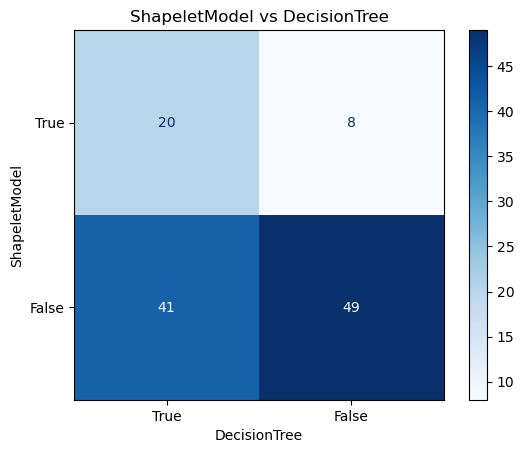

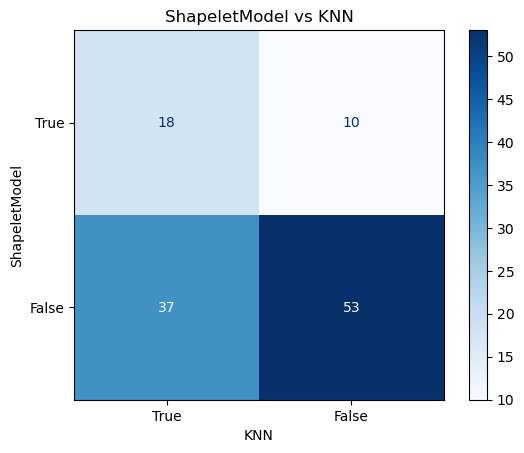

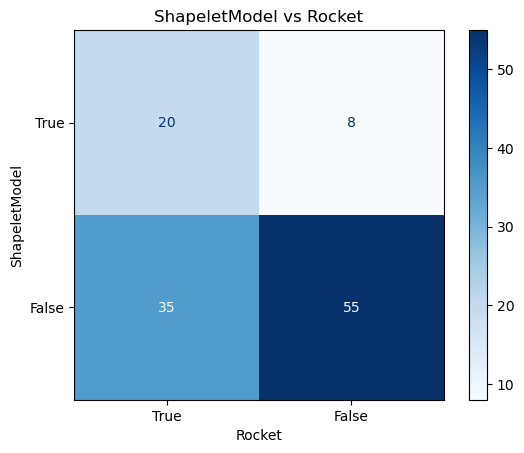

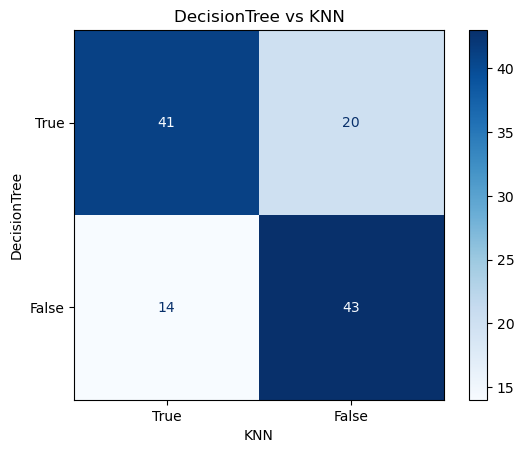

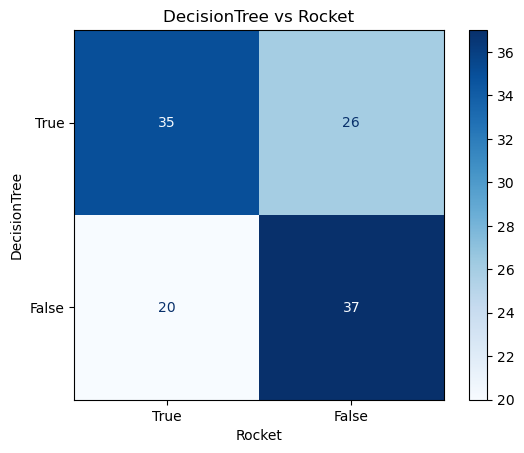

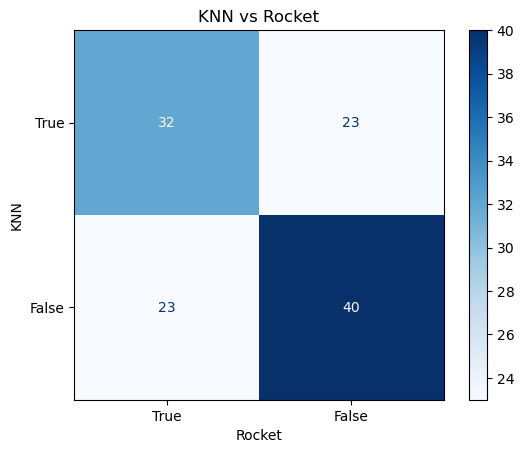

In [1033]:
labels = [predicted_labels, predicted_labels_dt, predicted_labels_knn, predicted_labels_rocket]
labels_names = ['ShapeletModel', 'DecisionTree', 'KNN', 'Rocket']
# confusion matrix for each model comparison
for i in range(len(labels)):
    for j in np.arange(i+1, len(labels)):
        ConfusionMatrixDisplay(confusion_matrix(labels[i], labels[j]), 
        display_labels=[True, False]).plot(cmap=plt.cm.Blues,)
        plt.title(labels_names[i]+' vs '+labels_names[j])
        plt.ylabel(labels_names[i])
        plt.xlabel(labels_names[j]);

In [1048]:
from sklearn.metrics import f1_score
for i in range(len(labels)):
    for j in np.arange(i+1, len(labels)):
        print(labels_names[i], 'vs', labels_names[j], ', macro f1 average:', 
        f1_score(y_true=labels[i], y_pred=labels[j]))


ShapeletModel vs DecisionTree , macro f1 average: 0.6666666666666667
ShapeletModel vs KNN , macro f1 average: 0.6928104575163399
ShapeletModel vs Rocket , macro f1 average: 0.7189542483660131
DecisionTree vs KNN , macro f1 average: 0.7166666666666668
DecisionTree vs Rocket , macro f1 average: 0.6166666666666668
KNN vs Rocket , macro f1 average: 0.6349206349206349
